Preprocessing EMNIST Letters

In [5]:
label_map = {
    1: 0,   # a
    2: 1,   # b
    4: 2,   # d
    5: 3,   # e
    6: 4,   # f
    7: 5,   # g
    9: 6,   # i
    10: 7,  # j
    12: 8,  # l
    14: 9,  # n
    15: 10, # o
    16: 11, # p
    17: 12, # q
    20: 13, # t
    24: 14, # x
    26: 15  # z
}

In [6]:
import pandas as pd
import numpy as np
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split

# Load data
df = pd.read_csv("emnist-letters-train.csv")

# Remove rows where label negative (pure black)
df = df[df.iloc[:, 0] >= 0]

# Define allowed labels
allowed_labels = list(label_map.keys())

# Filter rows only with allowed labels
df = df[df.iloc[:, 0].isin(allowed_labels)]

# Remap labels to 0-15 using label_map
df['mapped_label'] = df.iloc[:, 0].map(label_map)

# Extract labels and images
labels = df['mapped_label'].values
images = df.iloc[:, 1:-1].values  # exclude original label and mapped_label columns

# Normalize images
images = images.astype("float32") / 255.0

# Reshape images to (28, 28, 1)
images = images.reshape((-1, 28, 28, 1))

# One-hot encode labels
one_hot_labels = to_categorical(labels, num_classes=16)

# Train-validation split
x_train, x_val, y_train, y_val = train_test_split(images, one_hot_labels, test_size=0.1, random_state=42)


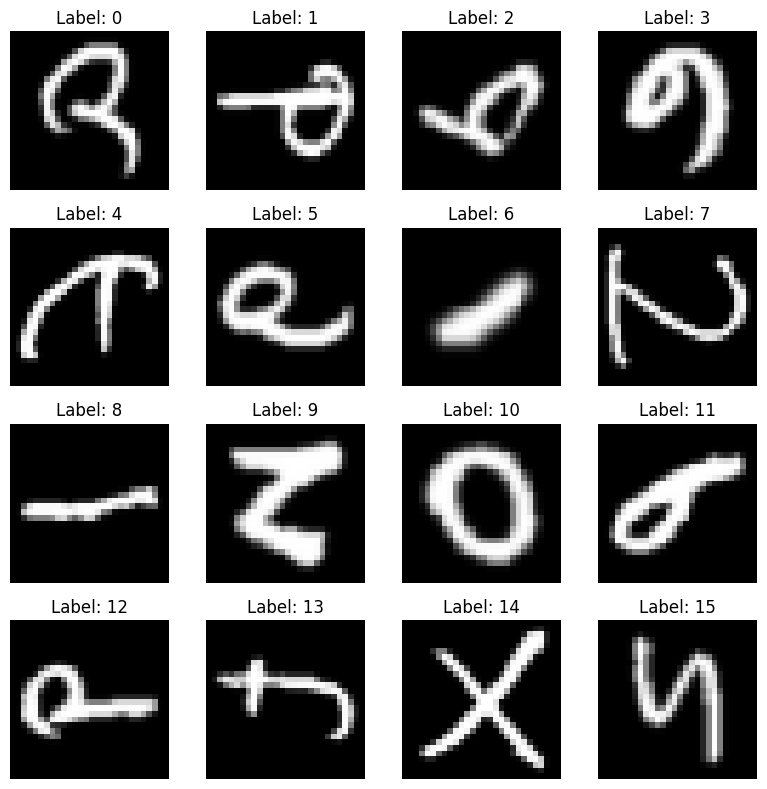

In [7]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(8, 8))

num_classes = 16

for label in range(num_classes):
    # Find indices of all samples with current label
    indices = np.where(np.argmax(y_train, axis=1) == label)[0]
    
    # Randomly pick one index from this class
    idx = np.random.choice(indices)
    
    # Plot the image
    plt.subplot(4, 4, label + 1)
    plt.imshow(x_train[idx].squeeze(), cmap='gray')
    plt.axis('off')
    plt.title(f"Label: {label}")

plt.tight_layout()
plt.show()


Basic gan

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

class BasicGAN:
    def __init__(self, img_shape=(28,28,1), latent_dim=100):
        self.img_shape = img_shape
        self.latent_dim = latent_dim
        
        # Build and compile discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(0.0002, 0.5),
            metrics=['accuracy']
        )
        
        # Build generator
        self.generator = self.build_generator()
        
        # Build combined GAN model
        self.gan = self.build_gan()
        self.gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(0.0002, 0.5))
    
    def build_generator(self):
        model = models.Sequential([
            layers.Dense(256, activation='relu', input_dim=self.latent_dim),
            layers.Dense(512, activation='relu'),
            layers.Dense(1024, activation='relu'),
            layers.Dense(np.prod(self.img_shape), activation='sigmoid'),
            layers.Reshape(self.img_shape)
        ])
        return model
    
    def build_discriminator(self):
        model = models.Sequential([
            layers.Flatten(input_shape=self.img_shape),
            layers.Dense(512, activation='relu'),
            layers.Dense(256, activation='relu'),
            layers.Dense(1, activation='sigmoid')
        ])
        return model
    
    def build_gan(self):
        self.discriminator.trainable = False
        noise = layers.Input(shape=(self.latent_dim,))
        img = self.generator(noise)
        validity = self.discriminator(img)
        return models.Model(noise, validity)
    
    def train(self, x_train, epochs, batch_size=64, sample_interval=500):
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        for epoch in range(1, epochs+1):
            # Train discriminator
            idx = np.random.randint(0, x_train.shape[0], batch_size)
            real_imgs = x_train[idx]
            
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)
            
            d_loss_real = self.discriminator.train_on_batch(real_imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            
            # Train generator
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            g_loss = self.gan.train_on_batch(noise, valid)
            
            if epoch % sample_interval == 0 or epoch == 1:
                print(f"{epoch} [D loss: {d_loss[0]:.4f}, acc.: {100*d_loss[1]:.2f}%] [G loss: {g_loss:.4f}]")
                self.sample_images(epoch)
    
    def sample_images(self, epoch, n=25):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        gen_imgs = gen_imgs * 255
        
        plt.figure(figsize=(5,5))
        for i in range(n):
            plt.subplot(5, 5, i+1)
            plt.imshow(gen_imgs[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.show()
    
    def generate_images(self, n):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        return gen_imgs

    def save_generated_images(self, n=160, folder="basicganimg"):
        """
        Generate and save `n` images into the specified folder.
        Images are saved as PNGs: image_000.png, image_001.png, ...
        """
        if not os.path.exists(folder):
            os.makedirs(folder)

        gen_imgs = self.generate_images(n)
        gen_imgs = (gen_imgs * 255).astype("uint8")

        for i in range(n):
            img = gen_imgs[i, :, :, 0]  # grayscale image
            filepath = os.path.join(folder, f"image_{i:03d}.png")
            plt.imsave(filepath, img, cmap='gray')
        
        print(f"Saved {n} images to folder: {folder}")


2/2 [==============================] - 2s 0s/step
1 [D loss: 1.0937, acc.: 21.09%] [G loss: 0.5625]
1/1 [==============================] - 0s 62ms/step


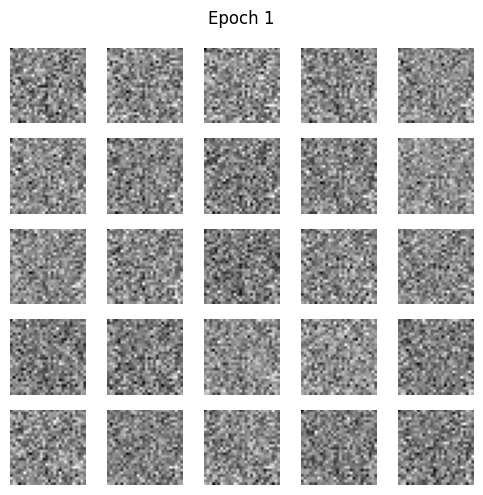

2/2 [==============================] - 0s 0s/step
100 [D loss: 0.3609, acc.: 90.62%] [G loss: 3.6379]
1/1 [==============================] - 0s 16ms/step


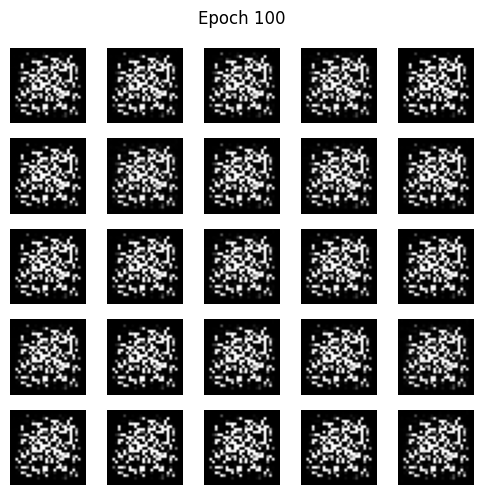

2/2 [==============================] - 0s 0s/step


KeyboardInterrupt: 

In [ ]:
gan = BasicGAN()
gan.train(x_train, epochs=5000, batch_size=64, sample_interval=100)

# Generate 160 images after training
gan.save_generated_images(n=160, folder="basicganimg")

DCGAN

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

class DCGAN:
    def __init__(self, img_shape=(28, 28, 1), latent_dim=100):
        self.img_shape = img_shape
        self.latent_dim = latent_dim

        # Build and compile discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(0.0002, 0.5),
            metrics=['accuracy']
        )

        # Build generator
        self.generator = self.build_generator()

        # Combined model
        self.gan = self.build_gan()
        self.gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(0.0002, 0.5))

    def build_generator(self):
        model = models.Sequential()
        model.add(layers.Dense(7 * 7 * 128, use_bias=False, input_dim=self.latent_dim))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(alpha=0.2))
        model.add(layers.Reshape((7, 7, 128)))

        model.add(layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(alpha=0.2))

        model.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
        model.add(layers.BatchNormalization())
        model.add(layers.LeakyReLU(alpha=0.2))

        model.add(layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid'))
        return model

    def build_discriminator(self):
        model = models.Sequential()
        model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=self.img_shape))
        model.add(layers.LeakyReLU(alpha=0.2))
        model.add(layers.Dropout(0.3))

        model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
        model.add(layers.LeakyReLU(alpha=0.2))
        model.add(layers.Dropout(0.3))

        model.add(layers.Flatten())
        model.add(layers.Dense(1, activation='sigmoid'))
        return model

    def build_gan(self):
        self.discriminator.trainable = False
        noise = layers.Input(shape=(self.latent_dim,))
        img = self.generator(noise)
        validity = self.discriminator(img)
        return models.Model(noise, validity)

    def train(self, x_train, epochs, batch_size=64, sample_interval=500):
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(1, epochs + 1):
            # Train discriminator
            idx = np.random.randint(0, x_train.shape[0], batch_size)
            real_imgs = x_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise, verbose=0)

            d_loss_real = self.discriminator.train_on_batch(real_imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # Train generator
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            g_loss = self.gan.train_on_batch(noise, valid)

            if epoch % sample_interval == 0 or epoch == 1:
                print(f"{epoch} [D loss: {d_loss[0]:.4f}, acc.: {100 * d_loss[1]:.2f}%] [G loss: {g_loss:.4f}]")
                # print(f"\nepoch {epoch} output\n")
                self.sample_images(epoch)

    def sample_images(self, epoch, n=25):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)
        gen_imgs = gen_imgs * 255

        plt.figure(figsize=(5, 5))
        for i in range(n):
            plt.subplot(5, 5, i + 1)
            plt.imshow(gen_imgs[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.show()

    def generate_images(self, n):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise, verbose=0)
        return gen_imgs

    def save_generated_images(self, n=160, folder="dcganimg"):
        """
        Generate and save `n` images into the specified folder.
        Images are saved as PNGs: image_000.png, image_001.png, ...
        """
        if not os.path.exists(folder):
            os.makedirs(folder)

        gen_imgs = self.generate_images(n)
        gen_imgs = (gen_imgs * 255).astype("uint8")

        for i in range(n):
            img = gen_imgs[i, :, :, 0]  # grayscale image
            filepath = os.path.join(folder, f"image_{i:03d}.png")
            plt.imsave(filepath, img, cmap='gray')

        print(f"Saved {n} images to folder: {folder}")


1 [D loss: 0.7292, acc.: 13.28%] [G loss: 0.6806]

epoch 1 output



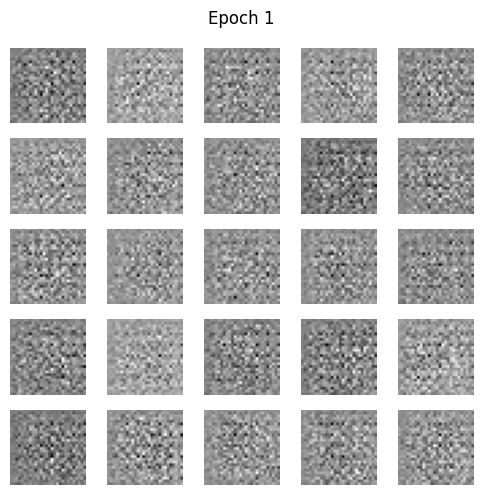

500 [D loss: 0.4667, acc.: 77.34%] [G loss: 0.2464]

epoch 500 output



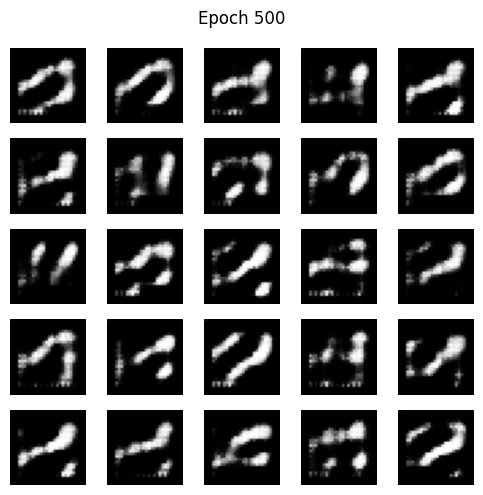

1000 [D loss: 0.6867, acc.: 54.69%] [G loss: 0.8262]

epoch 1000 output



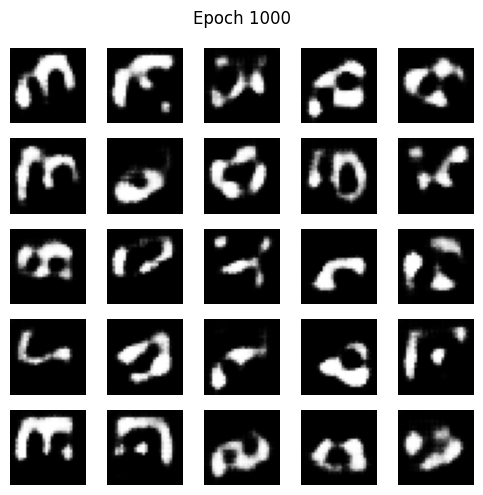

1500 [D loss: 0.6995, acc.: 53.91%] [G loss: 0.7864]

epoch 1500 output



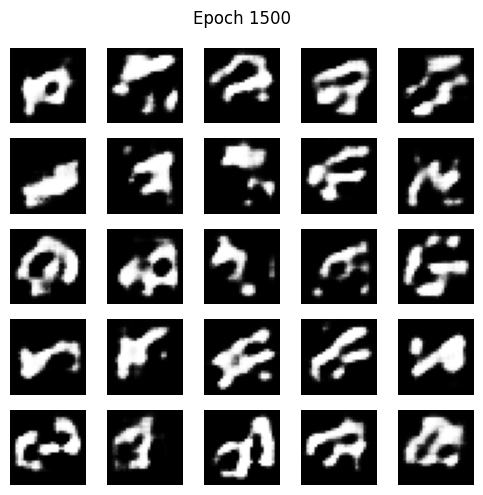

2000 [D loss: 0.6590, acc.: 64.06%] [G loss: 0.7531]

epoch 2000 output



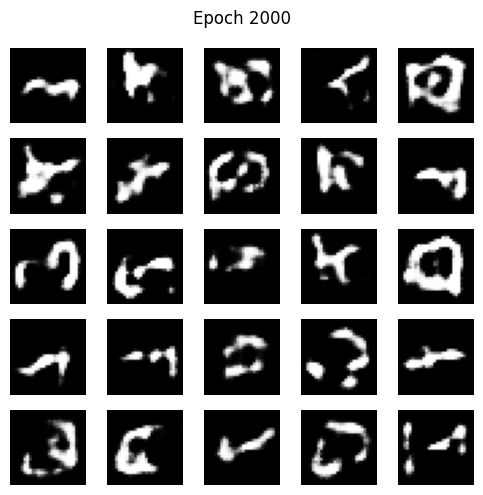

2500 [D loss: 0.6936, acc.: 54.69%] [G loss: 0.7318]

epoch 2500 output



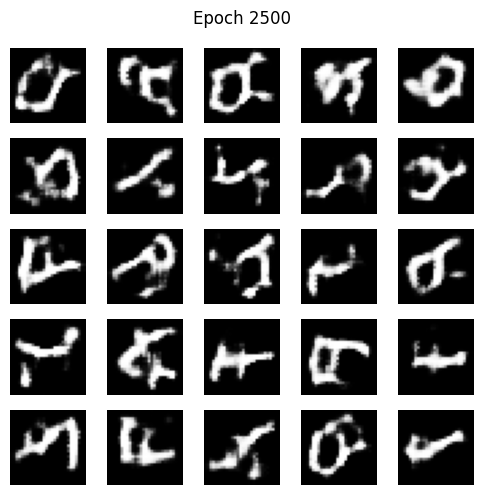

3000 [D loss: 0.6865, acc.: 52.34%] [G loss: 0.7349]

epoch 3000 output



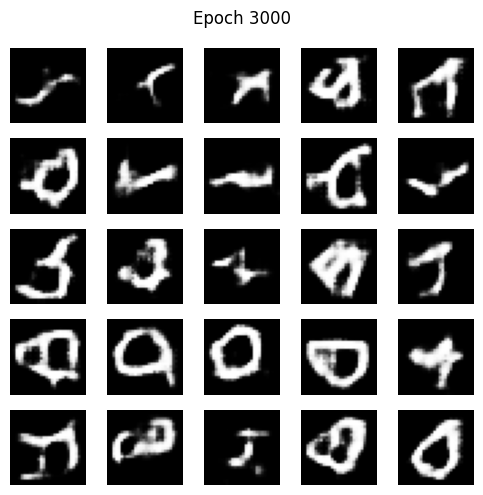

3500 [D loss: 0.7129, acc.: 43.75%] [G loss: 0.7447]

epoch 3500 output



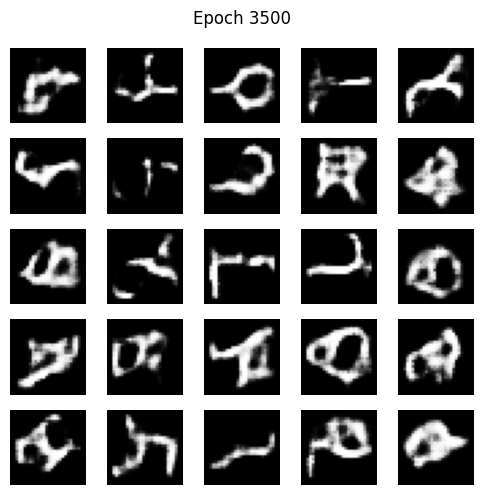

4000 [D loss: 0.6999, acc.: 50.00%] [G loss: 0.7319]

epoch 4000 output



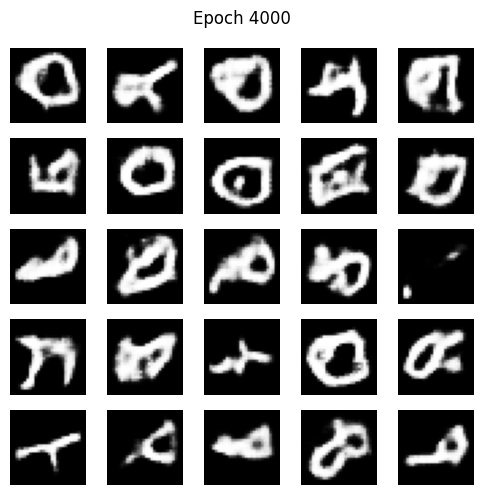

4500 [D loss: 0.6892, acc.: 57.03%] [G loss: 0.7390]

epoch 4500 output



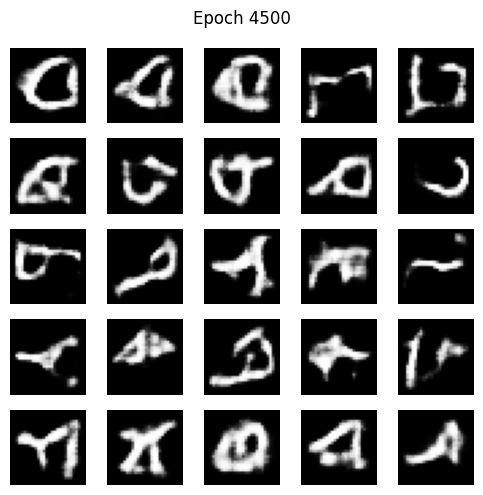

5000 [D loss: 0.6838, acc.: 54.69%] [G loss: 0.7295]

epoch 5000 output



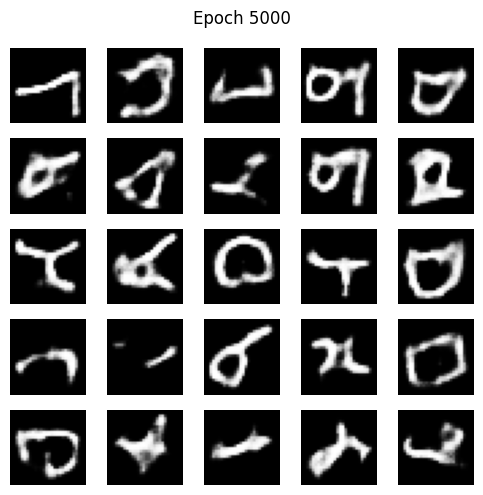

Saved 160 images to folder: dcganimg


In [ ]:
dcgan = DCGAN()
dcgan.train(x_train, epochs=5000, batch_size=64, sample_interval=500)

# Save 160 images after training
dcgan.save_generated_images(n=160, folder="dcganimg")

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

class DCGAN2:
    def __init__(self, img_shape=(28,28,1), latent_dim=100):
        self.img_shape = img_shape
        self.latent_dim = latent_dim
        
        # Build and compile discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(0.0002, 0.5),
            metrics=['accuracy']
        )
        
        # Build generator
        self.generator = self.build_generator()
        
        # Build combined GAN model
        self.gan = self.build_gan()
        self.gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(0.0002, 0.5))
    
    def build_generator(self):
        model = models.Sequential([
            layers.Dense(7 * 7 * 128, use_bias=False, input_dim=self.latent_dim),
            layers.BatchNormalization(),
            layers.LeakyReLU(alpha=0.2),
            layers.Reshape((7, 7, 128)),
            
            layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False),
            layers.BatchNormalization(),
            layers.LeakyReLU(alpha=0.2),

            layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')
        ])
        return model
    
    def build_discriminator(self):
        model = models.Sequential([
            layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=self.img_shape),
            layers.LeakyReLU(alpha=0.2),
            layers.Dropout(0.3),

            layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
            layers.LeakyReLU(alpha=0.2),
            layers.Dropout(0.3),

            layers.Flatten(),
            layers.Dense(1, activation='sigmoid')
        ])
        return model
    
    def build_gan(self):
        self.discriminator.trainable = False
        noise = layers.Input(shape=(self.latent_dim,))
        img = self.generator(noise)
        validity = self.discriminator(img)
        return models.Model(noise, validity)
    
    def train(self, x_train, epochs, batch_size=64, sample_interval=500):
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        for epoch in range(1, epochs+1):
            # Train discriminator
            idx = np.random.randint(0, x_train.shape[0], batch_size)
            real_imgs = x_train[idx]
            
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)
            
            d_loss_real = self.discriminator.train_on_batch(real_imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            
            # Train generator
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            g_loss = self.gan.train_on_batch(noise, valid)
            
            if epoch % sample_interval == 0 or epoch == 1:
                print(f"{epoch} [D loss: {d_loss[0]:.4f}, acc.: {100*d_loss[1]:.2f}%] [G loss: {g_loss:.4f}]")
                self.sample_images(epoch)
    
    def sample_images(self, epoch, n=25):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        gen_imgs = gen_imgs * 255
        
        plt.figure(figsize=(5,5))
        for i in range(n):
            plt.subplot(5, 5, i+1)
            plt.imshow(gen_imgs[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.show()
    
    def generate_images(self, n):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        return gen_imgs

    def save_generated_images(self, n=160, folder="basicganimg"):
        """
        Generate and save `n` images into the specified folder.
        Images are saved as PNGs: image_000.png, image_001.png, ...
        """
        if not os.path.exists(folder):
            os.makedirs(folder)

        gen_imgs = self.generate_images(n)
        gen_imgs = (gen_imgs * 255).astype("uint8")

        for i in range(n):
            img = gen_imgs[i, :, :, 0]  # grayscale image
            filepath = os.path.join(folder, f"image_{i:03d}.png")
            plt.imsave(filepath, img, cmap='gray')
        
        print(f"Saved {n} images to folder: {folder}")

2/2 [==============================] - 0s 4ms/step
1 [D loss: 0.7061, acc.: 48.44%] [G loss: 0.7648]
1/1 [==============================] - 0s 101ms/step


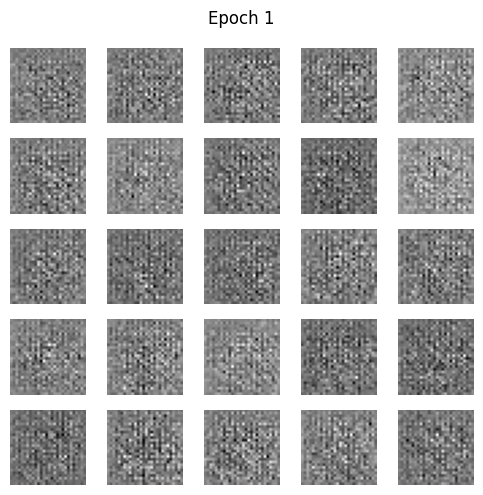

2/2 [==============================] - 0s 14ms/step
100 [D loss: 0.0610, acc.: 100.00%] [G loss: 0.3957]
1/1 [==============================] - 0s 18ms/step


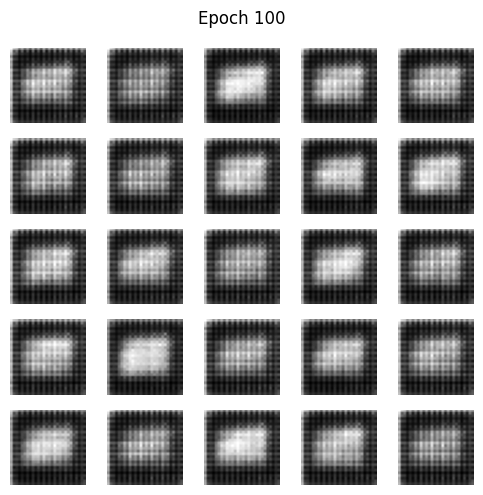

2/2 [==============================] - 0s 9ms/step
200 [D loss: 0.0231, acc.: 100.00%] [G loss: 0.1756]
1/1 [==============================] - 0s 16ms/step


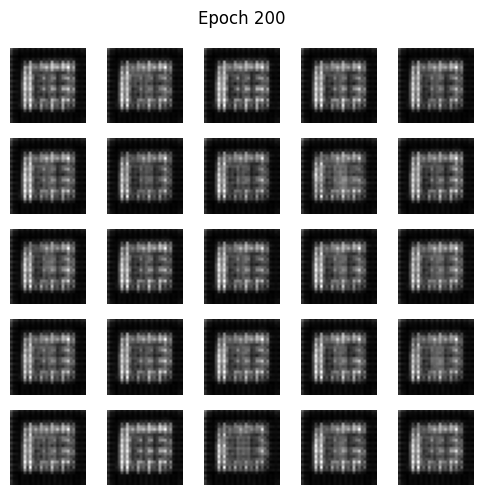

2/2 [==============================] - 0s 18ms/step
300 [D loss: 0.5216, acc.: 71.09%] [G loss: 7.0712]
1/1 [==============================] - 0s 16ms/step


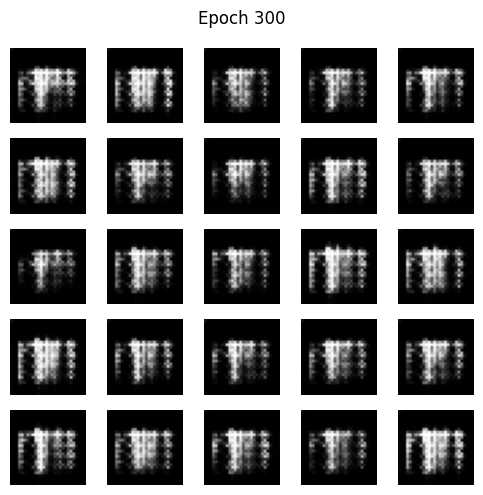

2/2 [==============================] - 0s 0s/step
400 [D loss: 0.8574, acc.: 43.75%] [G loss: 1.5251]
1/1 [==============================] - 0s 16ms/step


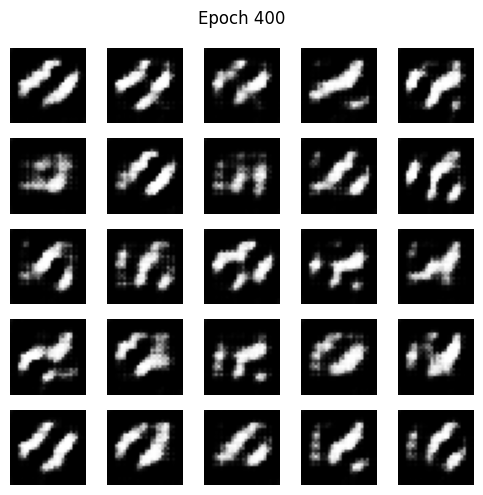

2/2 [==============================] - 0s 19ms/step
500 [D loss: 0.6150, acc.: 70.31%] [G loss: 1.5588]
1/1 [==============================] - 0s 16ms/step


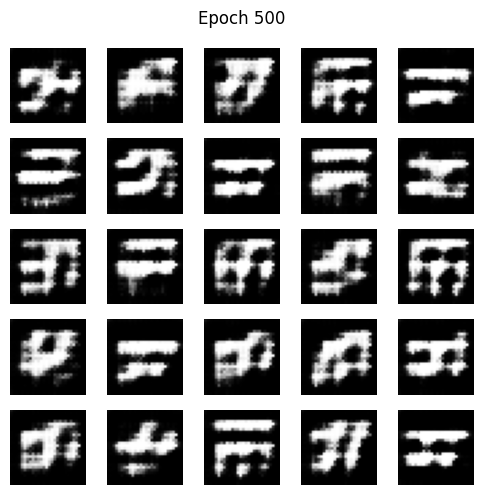

2/2 [==============================] - 0s 3ms/step
600 [D loss: 0.7424, acc.: 57.81%] [G loss: 1.0322]
1/1 [==============================] - 0s 16ms/step


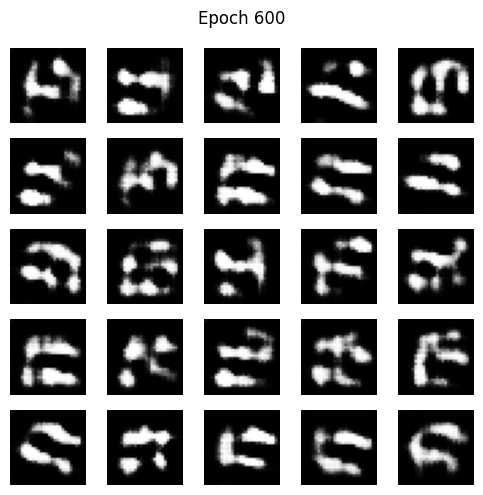

2/2 [==============================] - 0s 0s/step
700 [D loss: 0.6529, acc.: 61.72%] [G loss: 0.9464]
1/1 [==============================] - 0s 16ms/step


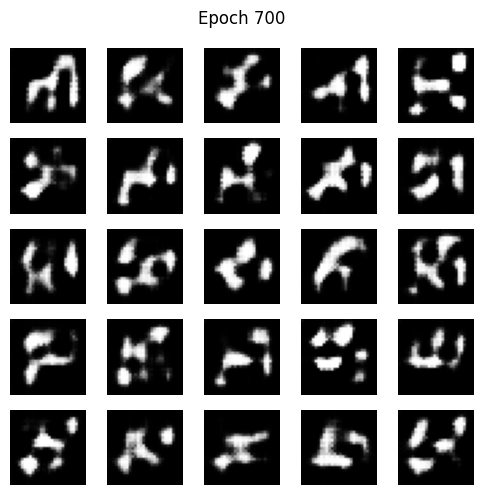

2/2 [==============================] - 0s 3ms/step
800 [D loss: 0.7457, acc.: 48.44%] [G loss: 0.8459]
1/1 [==============================] - 0s 15ms/step


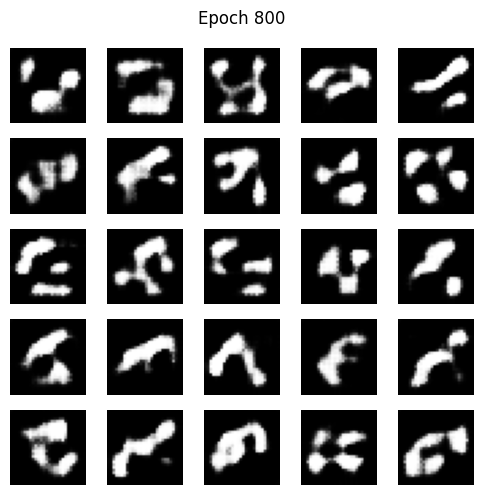

2/2 [==============================] - 0s 8ms/step
900 [D loss: 0.6780, acc.: 55.47%] [G loss: 0.8615]
1/1 [==============================] - 0s 26ms/step


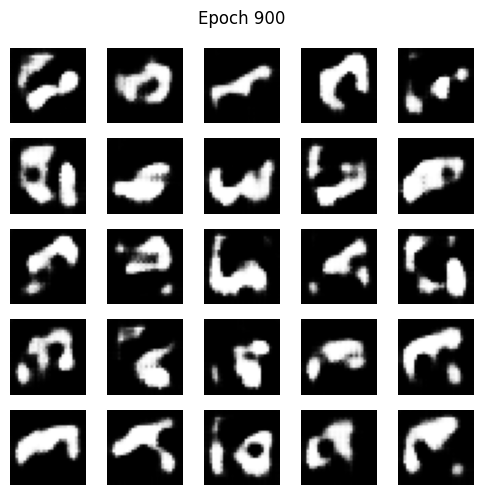

2/2 [==============================] - 0s 4ms/step
1000 [D loss: 0.6156, acc.: 67.97%] [G loss: 0.8093]
1/1 [==============================] - 0s 31ms/step


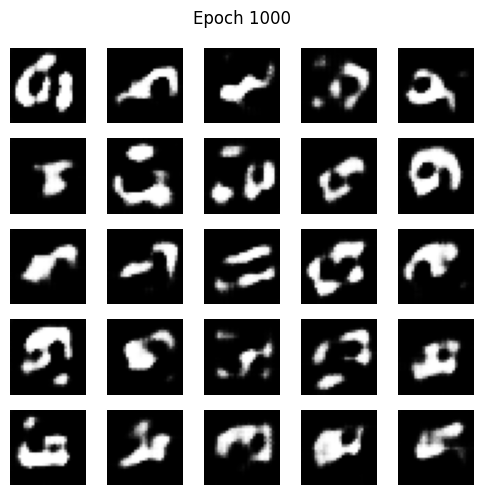

2/2 [==============================] - 0s 0s/step
1100 [D loss: 0.6758, acc.: 57.81%] [G loss: 0.8375]
1/1 [==============================] - 0s 16ms/step


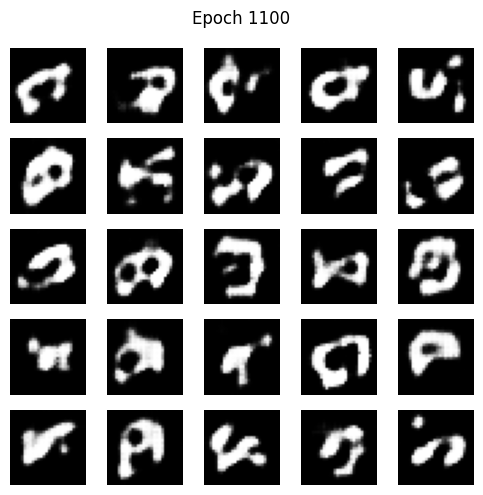

2/2 [==============================] - 0s 3ms/step
1200 [D loss: 0.7167, acc.: 50.78%] [G loss: 0.7751]
1/1 [==============================] - 0s 19ms/step


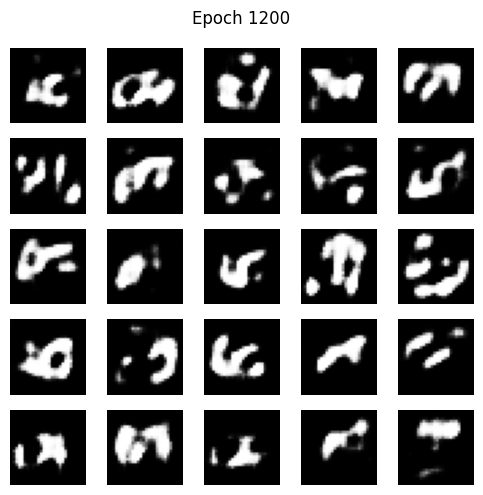

2/2 [==============================] - 0s 0s/step
1300 [D loss: 0.6831, acc.: 61.72%] [G loss: 0.8201]
1/1 [==============================] - 0s 20ms/step


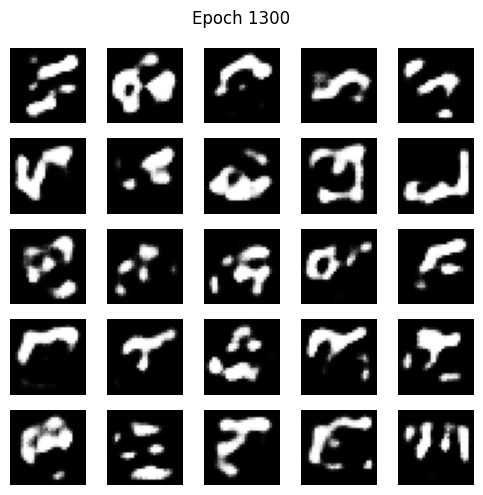

2/2 [==============================] - 0s 0s/step
1400 [D loss: 0.6919, acc.: 57.03%] [G loss: 0.8210]
1/1 [==============================] - 0s 16ms/step


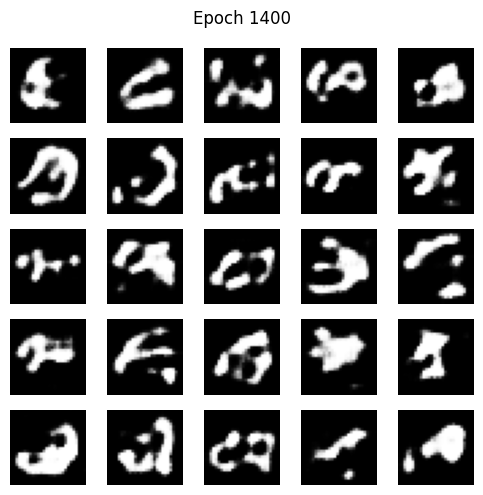

2/2 [==============================] - 0s 3ms/step
1500 [D loss: 0.6920, acc.: 53.12%] [G loss: 0.8097]
1/1 [==============================] - 0s 18ms/step


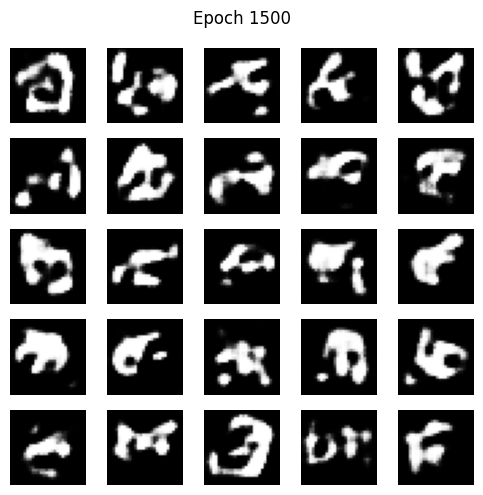

2/2 [==============================] - 0s 4ms/step
1600 [D loss: 0.6872, acc.: 50.78%] [G loss: 0.7641]
1/1 [==============================] - 0s 20ms/step


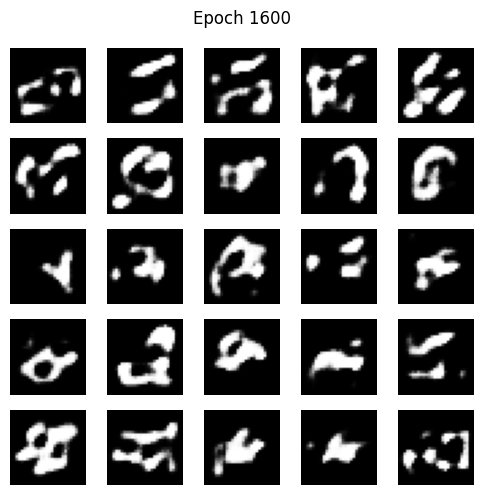

2/2 [==============================] - 0s 0s/step
1700 [D loss: 0.6648, acc.: 61.72%] [G loss: 0.7973]
1/1 [==============================] - 0s 29ms/step


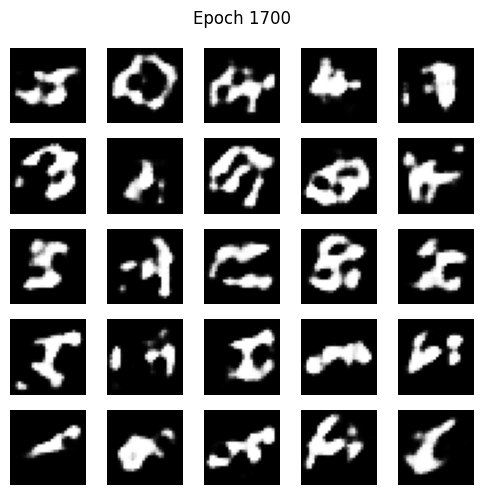

2/2 [==============================] - 0s 0s/step
1800 [D loss: 0.6701, acc.: 59.38%] [G loss: 0.8166]
1/1 [==============================] - 0s 16ms/step


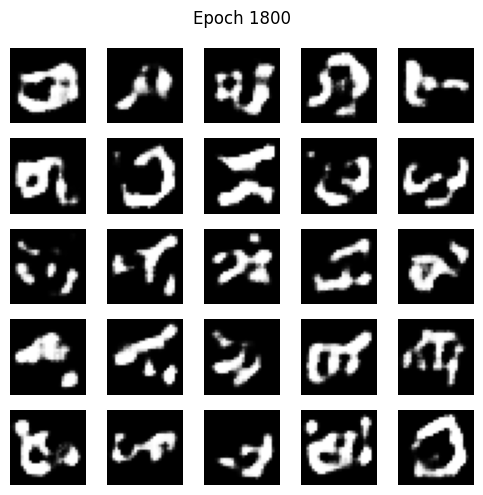

2/2 [==============================] - 0s 17ms/step
1900 [D loss: 0.6671, acc.: 58.59%] [G loss: 0.7523]
1/1 [==============================] - 0s 16ms/step


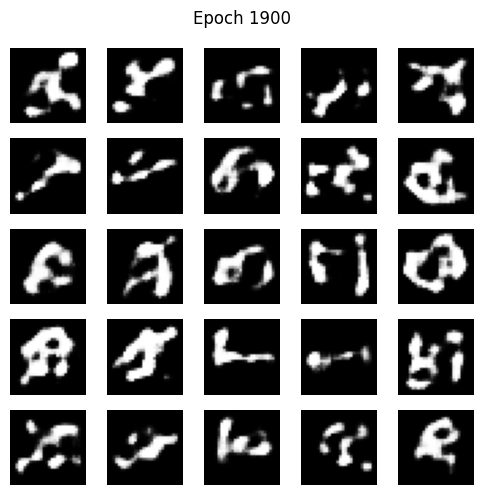

2/2 [==============================] - 0s 3ms/step
2000 [D loss: 0.6855, acc.: 53.91%] [G loss: 0.7677]
1/1 [==============================] - 0s 27ms/step


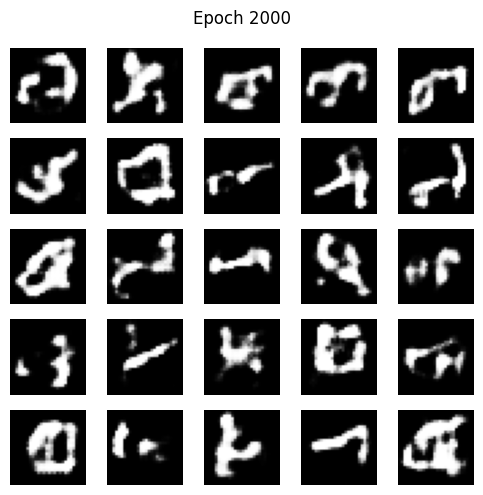

2/2 [==============================] - 0s 0s/step
2100 [D loss: 0.6827, acc.: 53.12%] [G loss: 0.7347]
1/1 [==============================] - 0s 16ms/step


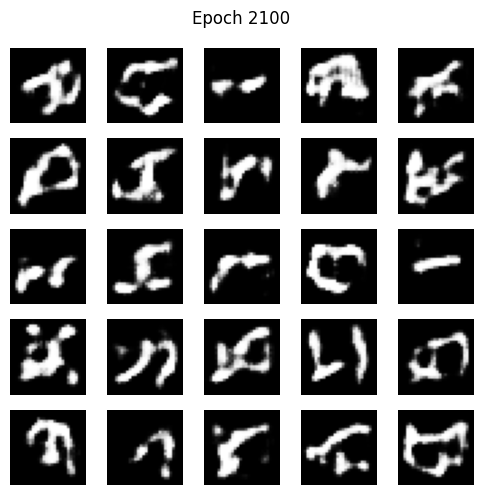

2/2 [==============================] - 0s 4ms/step
2200 [D loss: 0.6798, acc.: 52.34%] [G loss: 0.7685]
1/1 [==============================] - 0s 22ms/step


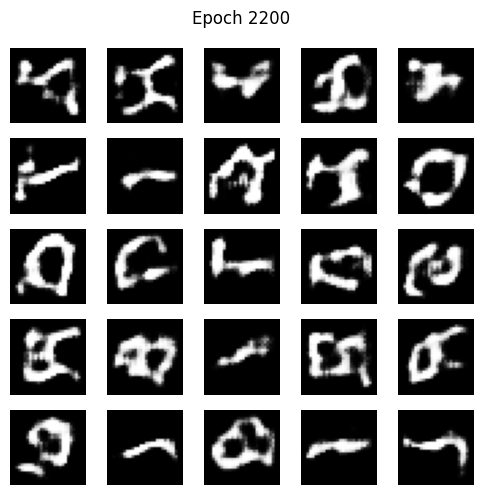

2/2 [==============================] - 0s 4ms/step
2300 [D loss: 0.6773, acc.: 60.16%] [G loss: 0.7239]
1/1 [==============================] - 0s 23ms/step


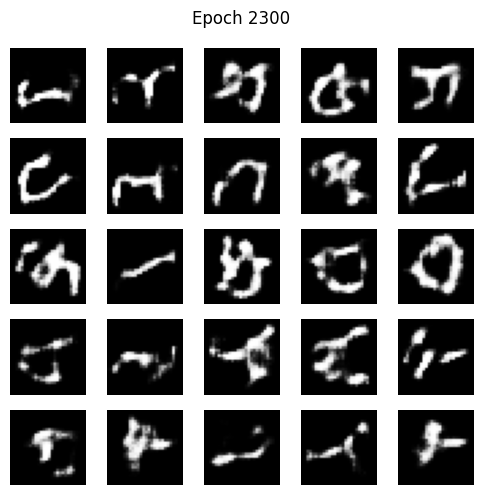

2/2 [==============================] - 0s 16ms/step
2400 [D loss: 0.6983, acc.: 51.56%] [G loss: 0.7233]
1/1 [==============================] - 0s 7ms/step


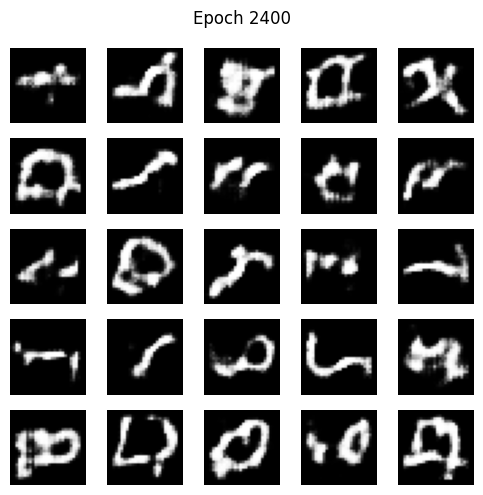

2/2 [==============================] - 0s 4ms/step
2500 [D loss: 0.6809, acc.: 51.56%] [G loss: 0.7777]
1/1 [==============================] - 0s 16ms/step


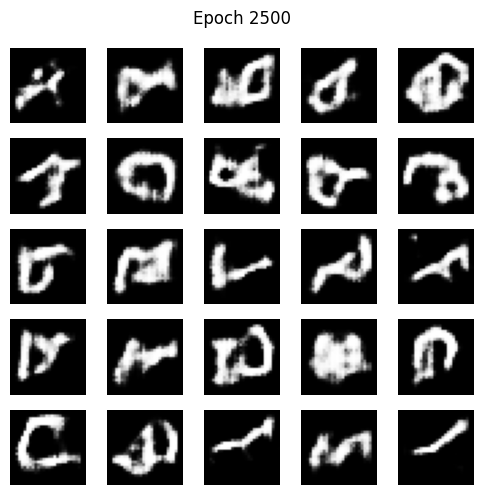

2/2 [==============================] - 0s 0s/step
2600 [D loss: 0.7248, acc.: 42.97%] [G loss: 0.7347]
1/1 [==============================] - 0s 14ms/step


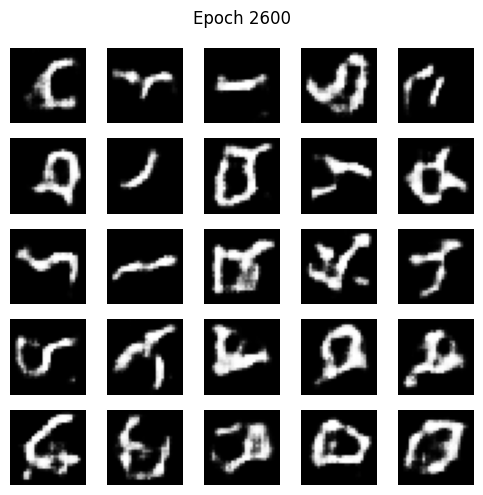

2/2 [==============================] - 0s 8ms/step
2700 [D loss: 0.7072, acc.: 53.91%] [G loss: 0.7607]
1/1 [==============================] - 0s 18ms/step


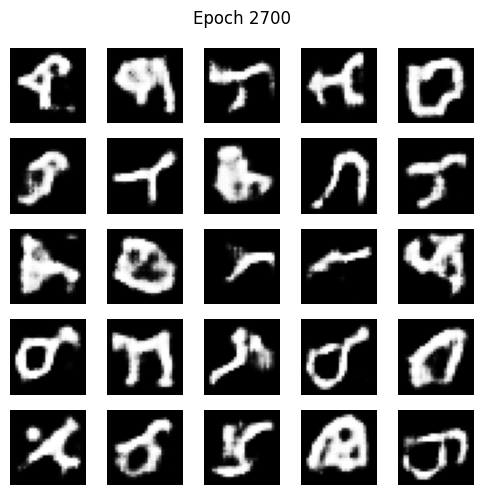

2/2 [==============================] - 0s 0s/step
2800 [D loss: 0.6991, acc.: 50.78%] [G loss: 0.7245]
1/1 [==============================] - 0s 16ms/step


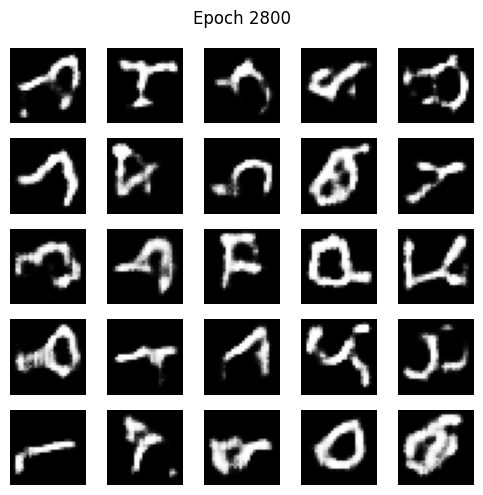

2/2 [==============================] - 0s 2ms/step
2900 [D loss: 0.7097, acc.: 46.09%] [G loss: 0.7696]
1/1 [==============================] - 0s 19ms/step


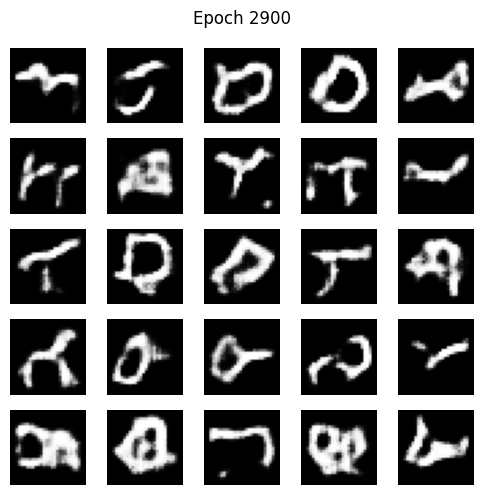

2/2 [==============================] - 0s 3ms/step
3000 [D loss: 0.7009, acc.: 50.78%] [G loss: 0.7681]
1/1 [==============================] - 0s 18ms/step


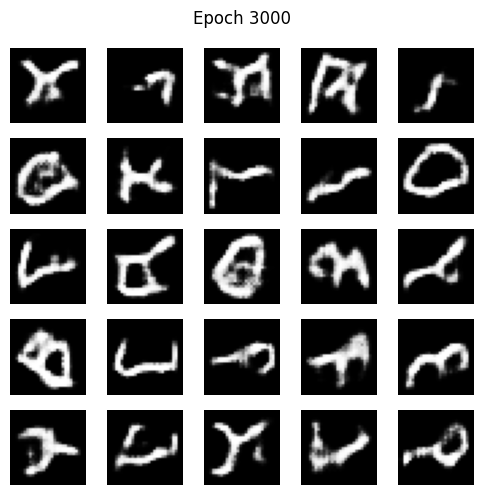

2/2 [==============================] - 0s 9ms/step
3100 [D loss: 0.7114, acc.: 41.41%] [G loss: 0.7306]
1/1 [==============================] - 0s 16ms/step


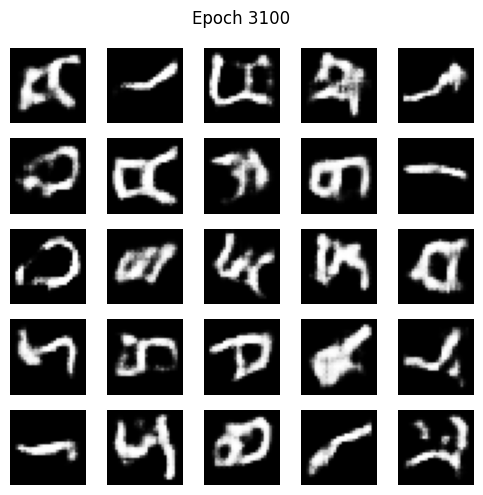

2/2 [==============================] - 0s 0s/step
3200 [D loss: 0.6995, acc.: 50.00%] [G loss: 0.7627]
1/1 [==============================] - 0s 10ms/step


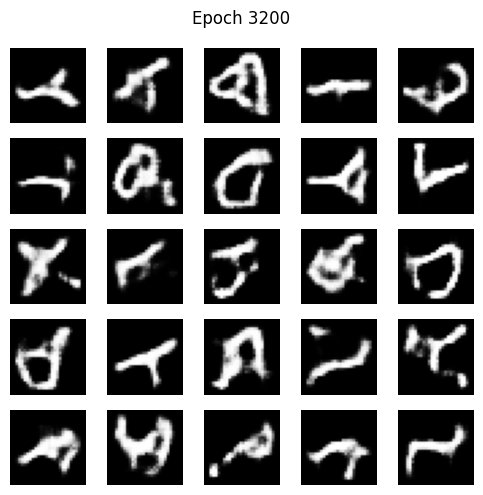

2/2 [==============================] - 0s 3ms/step
3300 [D loss: 0.7053, acc.: 46.09%] [G loss: 0.7371]
1/1 [==============================] - 0s 18ms/step


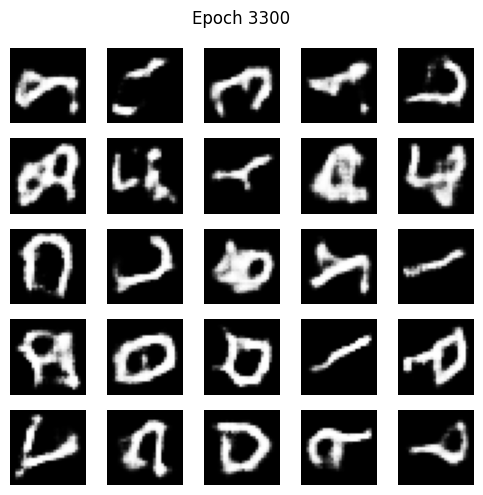

2/2 [==============================] - 0s 0s/step
3400 [D loss: 0.7042, acc.: 46.88%] [G loss: 0.7193]
1/1 [==============================] - 0s 16ms/step


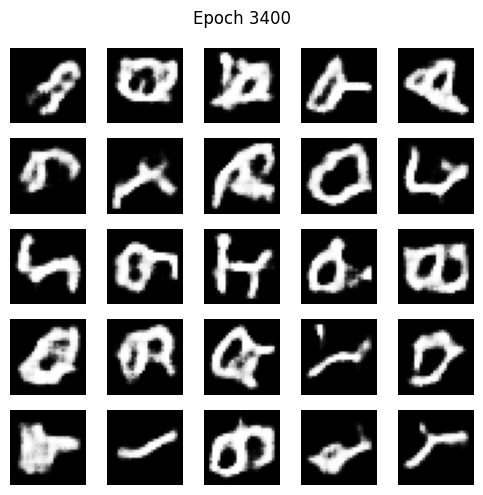

2/2 [==============================] - 0s 0s/step
3500 [D loss: 0.7001, acc.: 48.44%] [G loss: 0.7522]
1/1 [==============================] - 0s 16ms/step


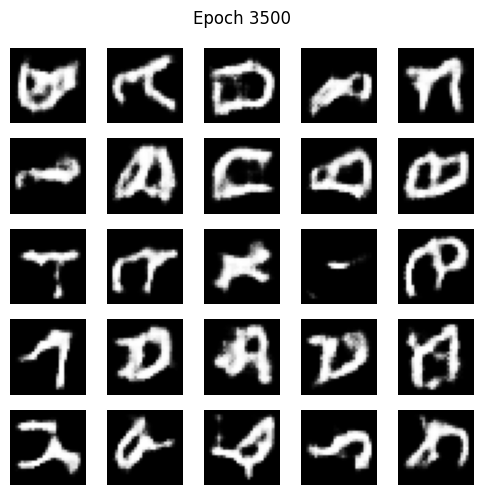

2/2 [==============================] - 0s 16ms/step
3600 [D loss: 0.7063, acc.: 43.75%] [G loss: 0.7360]
1/1 [==============================] - 0s 16ms/step


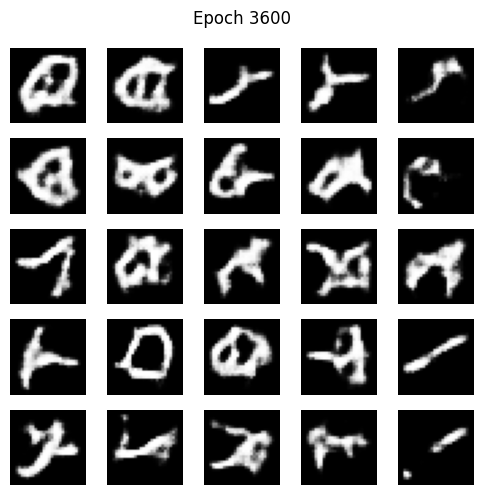

2/2 [==============================] - 0s 13ms/step
3700 [D loss: 0.7132, acc.: 44.53%] [G loss: 0.7090]
1/1 [==============================] - 0s 16ms/step


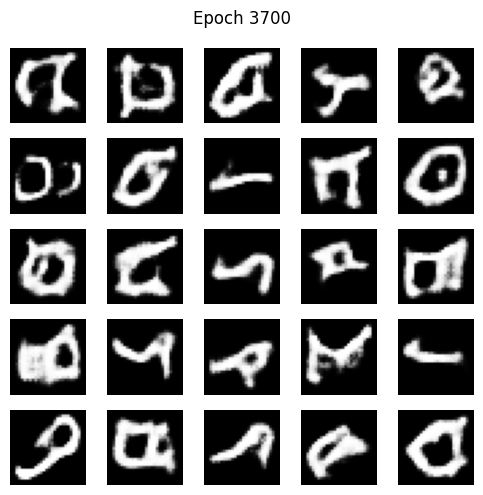

2/2 [==============================] - 0s 5ms/step
3800 [D loss: 0.7034, acc.: 49.22%] [G loss: 0.7099]
1/1 [==============================] - 0s 16ms/step


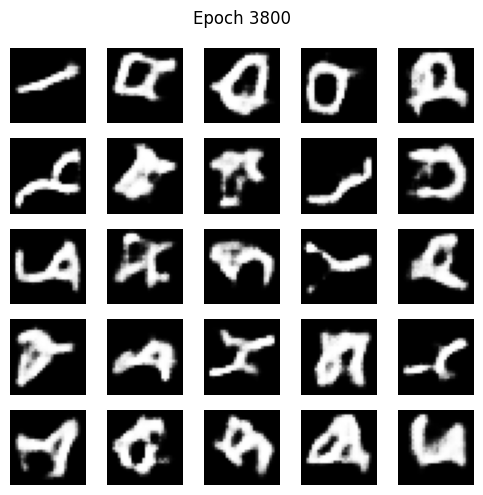

2/2 [==============================] - 0s 16ms/step
3900 [D loss: 0.6986, acc.: 50.00%] [G loss: 0.7297]
1/1 [==============================] - 0s 20ms/step


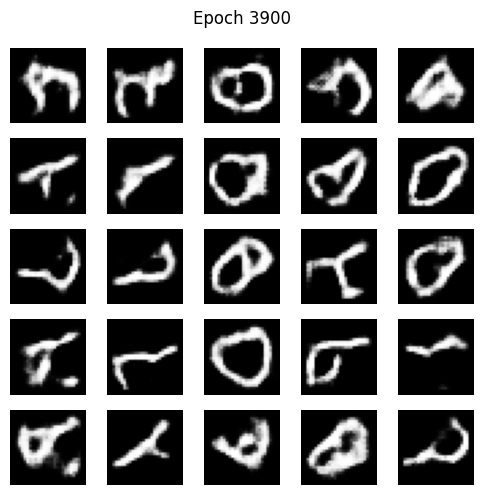

2/2 [==============================] - 0s 9ms/step
4000 [D loss: 0.6882, acc.: 57.81%] [G loss: 0.7456]
1/1 [==============================] - 0s 19ms/step


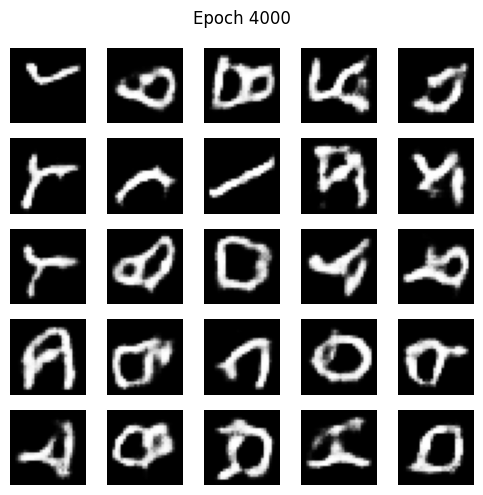

2/2 [==============================] - 0s 0s/step
4100 [D loss: 0.6881, acc.: 53.91%] [G loss: 0.7164]
1/1 [==============================] - 0s 16ms/step


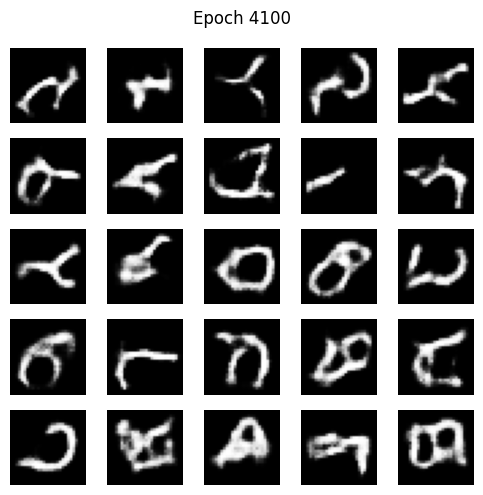

2/2 [==============================] - 0s 18ms/step
4200 [D loss: 0.7044, acc.: 50.00%] [G loss: 0.7353]
1/1 [==============================] - 0s 16ms/step


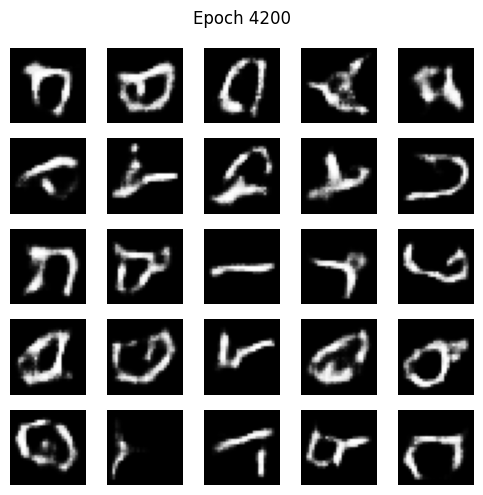

2/2 [==============================] - 0s 4ms/step
4300 [D loss: 0.6897, acc.: 60.16%] [G loss: 0.7288]
1/1 [==============================] - 0s 14ms/step


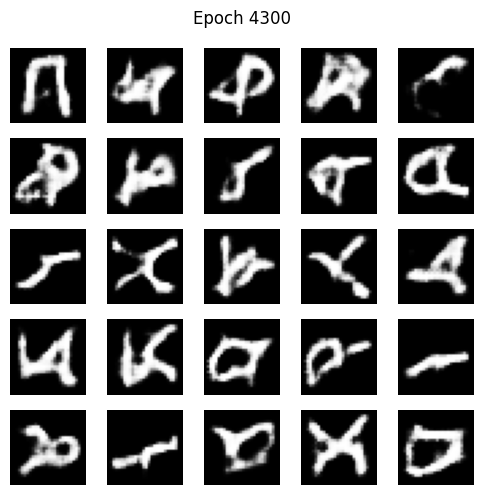

2/2 [==============================] - 0s 9ms/step
4400 [D loss: 0.7012, acc.: 50.78%] [G loss: 0.7637]
1/1 [==============================] - 0s 16ms/step


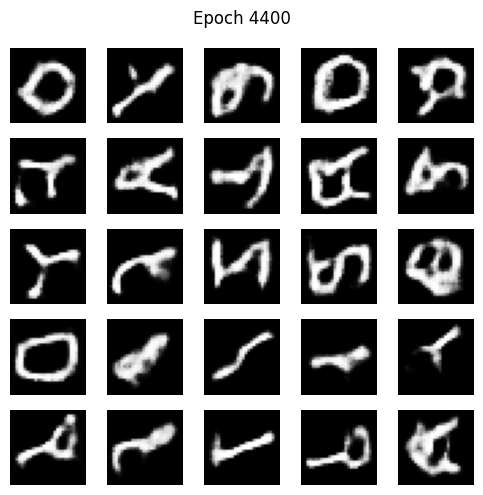

2/2 [==============================] - 0s 16ms/step
4500 [D loss: 0.6926, acc.: 49.22%] [G loss: 0.7434]
1/1 [==============================] - 0s 18ms/step


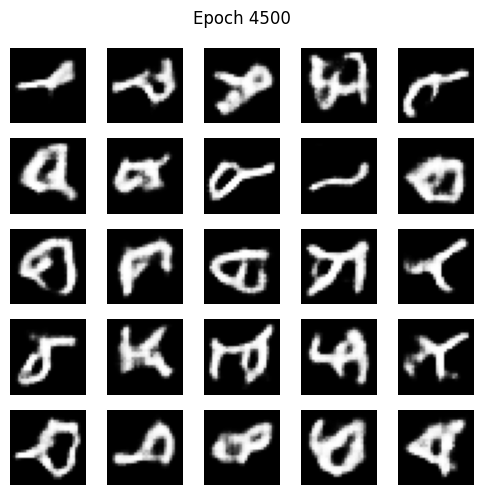

2/2 [==============================] - 0s 0s/step
4600 [D loss: 0.7057, acc.: 40.62%] [G loss: 0.7170]
1/1 [==============================] - 0s 16ms/step


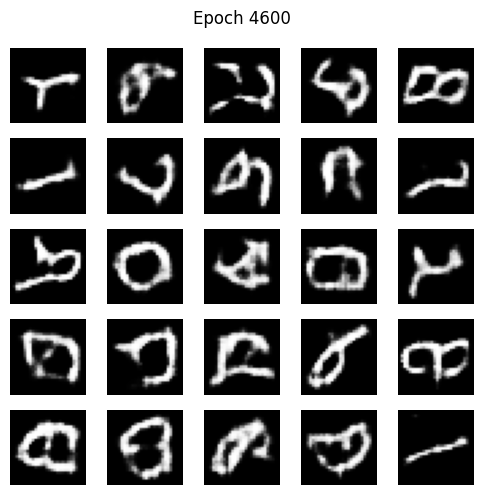

2/2 [==============================] - 0s 3ms/step
4700 [D loss: 0.6835, acc.: 50.78%] [G loss: 0.7031]
1/1 [==============================] - 0s 20ms/step


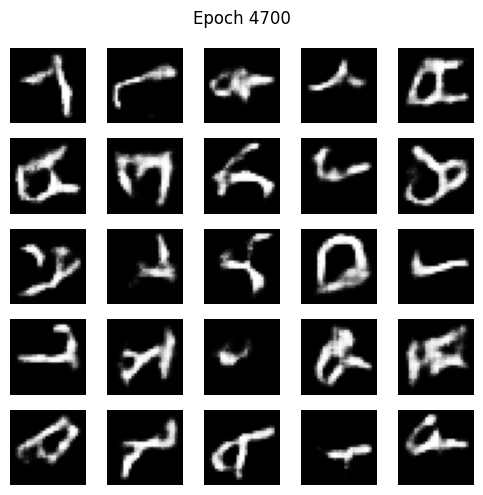

2/2 [==============================] - 0s 0s/step
4800 [D loss: 0.6950, acc.: 51.56%] [G loss: 0.7305]
1/1 [==============================] - 0s 16ms/step


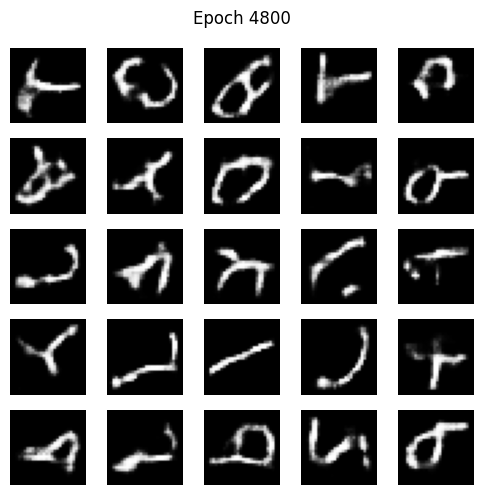

2/2 [==============================] - 0s 16ms/step
4900 [D loss: 0.6954, acc.: 46.09%] [G loss: 0.7315]
1/1 [==============================] - 0s 16ms/step


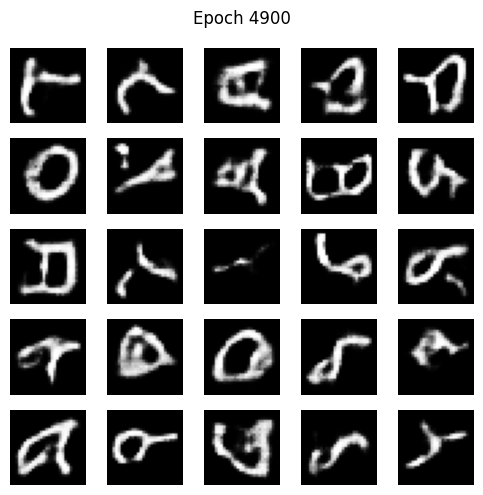

2/2 [==============================] - 0s 0s/step
5000 [D loss: 0.7071, acc.: 46.09%] [G loss: 0.6981]
1/1 [==============================] - 0s 16ms/step


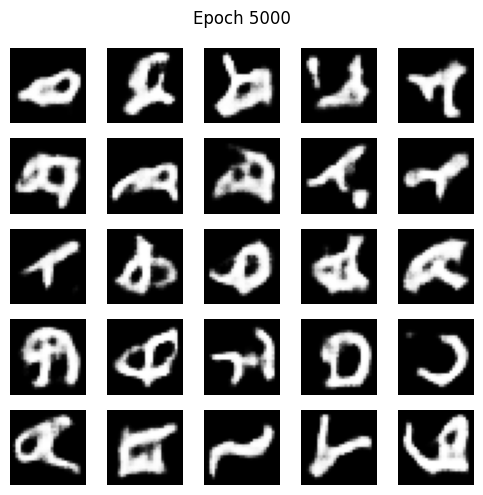

5/5 [==============================] - 0s 2ms/step
Saved 160 images to folder: dcgan2img


In [ ]:
dcgan2 = DCGAN2()
dcgan2.train(x_train, epochs=5000, batch_size=64, sample_interval=100)

# Generate 160 images after training
dcgan2.save_generated_images(n=160, folder="dcgan2img")

cGAN

In [8]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

class cGAN:
    def __init__(self, img_shape=(28,28,1), latent_dim=100, num_classes=16):
        self.img_shape = img_shape
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        
        # Build and compile discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss='binary_crossentropy',
            optimizer=tf.keras.optimizers.Adam(0.0002, 0.5),
            metrics=['accuracy']
        )
        
        # Build generator
        self.generator = self.build_generator()
        
        # Build combined GAN model
        self.gan = self.build_gan()
        self.gan.compile(loss='binary_crossentropy', optimizer=tf.keras.optimizers.Adam(0.0002, 0.5))
    
    def build_generator(self):
        noise_input = layers.Input(shape=(self.latent_dim,))
        label_input = layers.Input(shape=(self.num_classes,))
    
        # Concatenate noise and label
        x = layers.Concatenate()([noise_input, label_input])  # shape (116,)
    
        x = layers.Dense(7 * 7 * 128, use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Reshape((7, 7, 128))(x)
    
        x = layers.Conv2DTranspose(64, (5, 5), strides=(1, 1), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
    
        x = layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
    
        x = layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='sigmoid')(x)
    
        model = models.Model([noise_input, label_input], x)
        return model
    
    def build_discriminator(self):
        image_input = layers.Input(shape=self.img_shape)  # (28, 28, 1)
        label_input = layers.Input(shape=(self.num_classes,))
    
        # Map label to image size then reshape to (28, 28, 1)
        y = layers.Dense(np.prod(self.img_shape))(label_input)  # (784,)
        y = layers.Reshape(self.img_shape)(y)  # (28, 28, 1)
    
        # Concatenate label and image
        x = layers.Concatenate(axis=-1)([image_input, y])  # (28, 28, 2)
    
        x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)
    
        x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
        x = layers.LeakyReLU(alpha=0.2)(x)
        x = layers.Dropout(0.3)(x)
    
        x = layers.Flatten()(x)
        x = layers.Dense(1, activation='sigmoid')(x)
    
        model = models.Model([image_input, label_input], x)
        return model
    
    def build_gan(self):
        self.discriminator.trainable = False
        noise = layers.Input(shape=(self.latent_dim,))
        label = layers.Input(shape=(self.num_classes,))
        img = self.generator([noise, label])
        validity = self.discriminator([img, label])
        return models.Model([noise,label], validity)
    
    def train(self, x_train, y_train, epochs, batch_size=64, sample_interval=500):
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        for epoch in range(1, epochs+1):
            # Train discriminator
            idx = np.random.randint(0, x_train.shape[0], batch_size)
            real_imgs = x_train[idx]
            real_labels = y_train[idx] # one-hot labels
            
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            fake_labels = y_train[np.random.randint(0, y_train.shape[0], batch_size)] # Sample random labels
            gen_imgs = self.generator.predict([noise, fake_labels])
            
            d_loss_real = self.discriminator.train_on_batch([real_imgs, real_labels], valid)
            d_loss_fake = self.discriminator.train_on_batch([gen_imgs, fake_labels], fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            
            # Train generator
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            sampled_labels = y_train[np.random.randint(0, y_train.shape[0], batch_size)]
            g_loss = self.gan.train_on_batch([noise, sampled_labels], valid)
            
            if epoch % sample_interval == 0 or epoch == 1:
                print(f"{epoch} [D loss: {d_loss[0]:.4f}, acc.: {100*d_loss[1]:.2f}%] [G loss: {g_loss:.4f}]")
                self.sample_images(epoch, y_train)
    
    def sample_images(self, epoch, y_train, n=25):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        labels = y_train[np.random.randint(0, y_train.shape[0], n)]
        gen_imgs = self.generator.predict([noise, labels])
        gen_imgs = (gen_imgs * 255).astype("uint8")
        
        plt.figure(figsize=(5,5))
        for i in range(n):
            plt.subplot(5, 5, i+1)
            plt.imshow(gen_imgs[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.show()
    
    def generate_images(self, n, y_labels):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict([noise, y_labels])
        return gen_imgs

    def save_generated_images(self, n=160, folder="cganimg", y_labels=None):
        """
        Generate and save `n` images into the specified folder.
        Images are saved as PNGs: image_000.png, image_001.png, ...
        """
        if not os.path.exists(folder):
            os.makedirs(folder)

        if y_labels is None:
            y_labels = tf.keras.utils.to_categorical(np.random.randint(0, self.num_classes, n), num_classes=self.num_classes)

        gen_imgs = self.generate_images(n, y_labels)
        gen_imgs = (gen_imgs * 255).astype("uint8")

        for i in range(n):
            img = gen_imgs[i, :, :, 0]  # grayscale image
            filepath = os.path.join(folder, f"image_{i:03d}.png")
            plt.imsave(filepath, img, cmap='gray')
        
        print(f"Saved {n} images to folder: {folder}")

2/2 [==============================] - 12s 17ms/step
1 [D loss: 0.7155, acc.: 25.78%] [G loss: 0.6822]
1/1 [==============================] - 0s 147ms/step


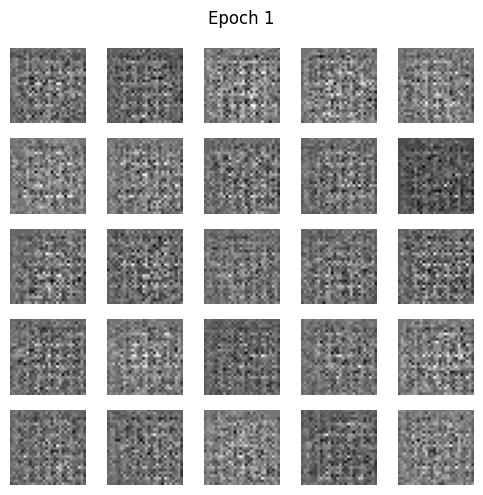

2/2 [==============================] - 0s 0s/step
100 [D loss: 0.0364, acc.: 99.22%] [G loss: 0.2166]
1/1 [==============================] - 0s 27ms/step


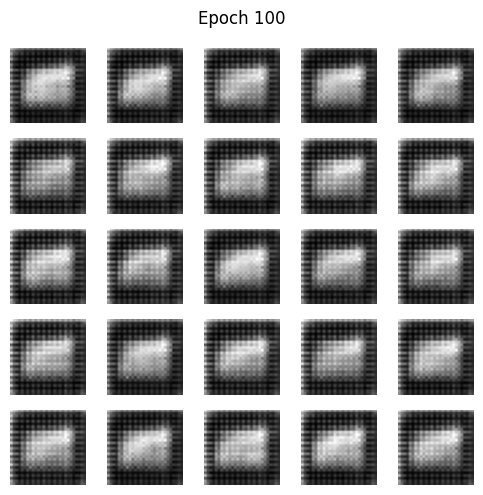

2/2 [==============================] - 0s 3ms/step
200 [D loss: 0.0081, acc.: 100.00%] [G loss: 0.1760]
1/1 [==============================] - 0s 27ms/step


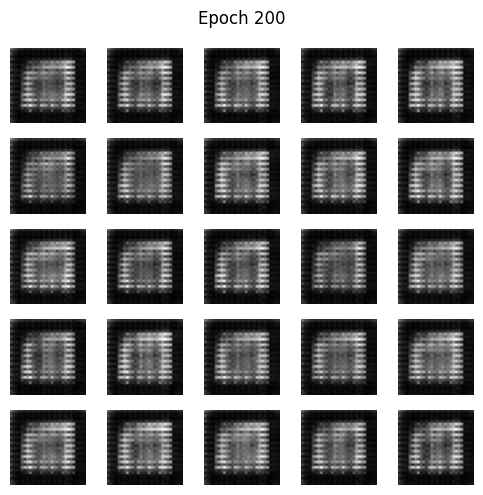

2/2 [==============================] - 0s 13ms/step
300 [D loss: 0.1186, acc.: 98.44%] [G loss: 1.7183]
1/1 [==============================] - 0s 26ms/step


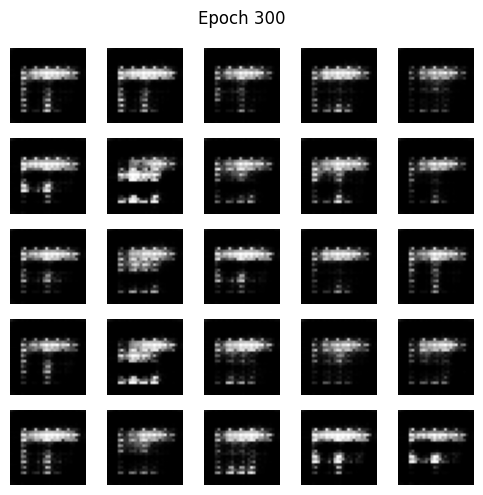

2/2 [==============================] - 0s 0s/step
400 [D loss: 0.1055, acc.: 97.66%] [G loss: 2.4341]
1/1 [==============================] - 0s 20ms/step


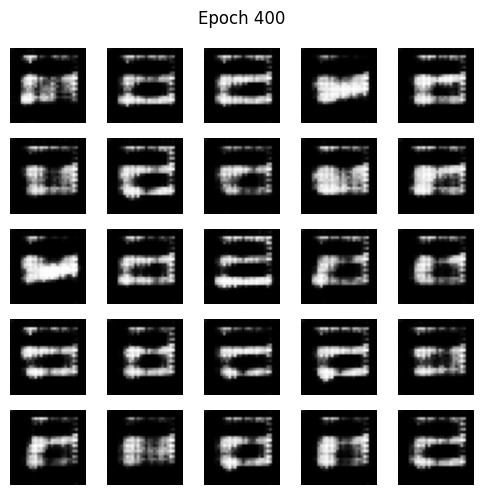

2/2 [==============================] - 0s 3ms/step
500 [D loss: 0.5780, acc.: 71.09%] [G loss: 0.6602]
1/1 [==============================] - 0s 20ms/step


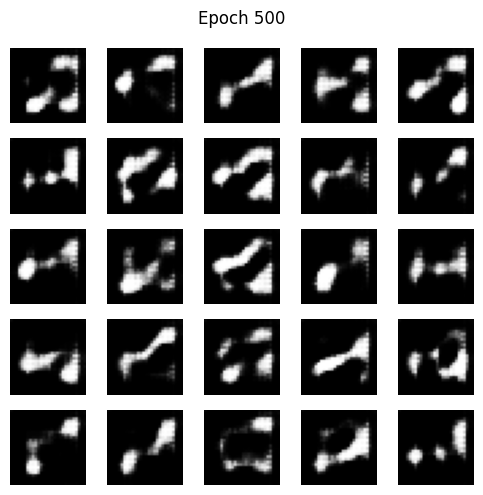

2/2 [==============================] - 0s 501us/step
600 [D loss: 0.7052, acc.: 53.91%] [G loss: 1.2328]
1/1 [==============================] - 0s 24ms/step


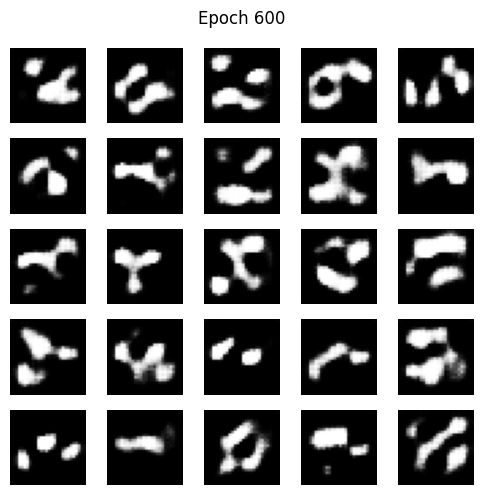

2/2 [==============================] - 0s 10ms/step
700 [D loss: 0.6992, acc.: 54.69%] [G loss: 0.9310]
1/1 [==============================] - 0s 18ms/step


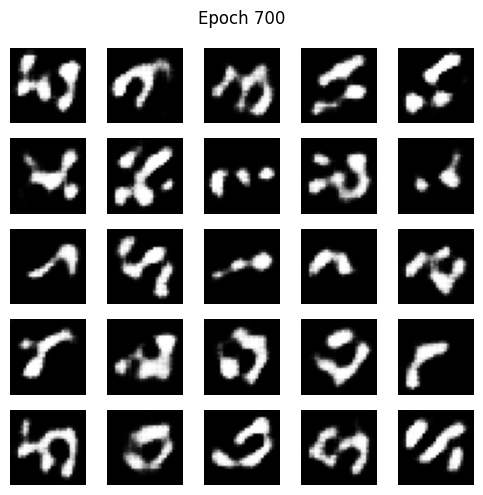

2/2 [==============================] - 0s 0s/step
800 [D loss: 0.7577, acc.: 45.31%] [G loss: 0.8723]
1/1 [==============================] - 0s 24ms/step


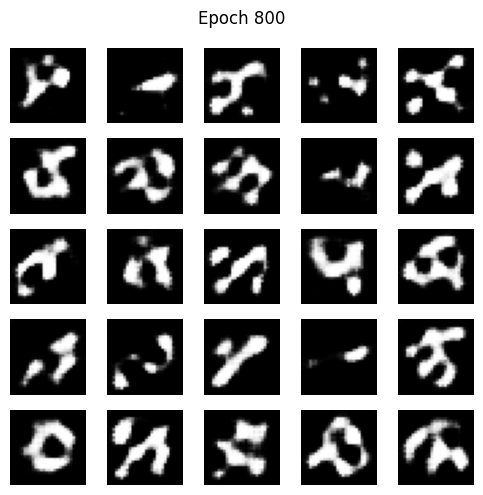

2/2 [==============================] - 0s 3ms/step
900 [D loss: 0.6933, acc.: 57.03%] [G loss: 0.8611]
1/1 [==============================] - 0s 21ms/step


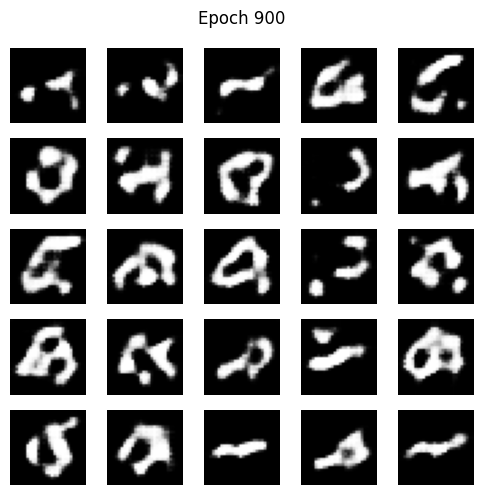

2/2 [==============================] - 0s 0s/step
1000 [D loss: 0.6933, acc.: 54.69%] [G loss: 0.8628]
1/1 [==============================] - 0s 33ms/step


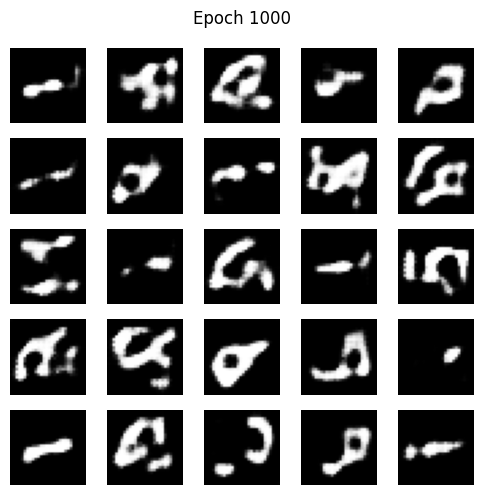

2/2 [==============================] - 0s 4ms/step
1100 [D loss: 0.7417, acc.: 48.44%] [G loss: 0.8179]
1/1 [==============================] - 0s 25ms/step


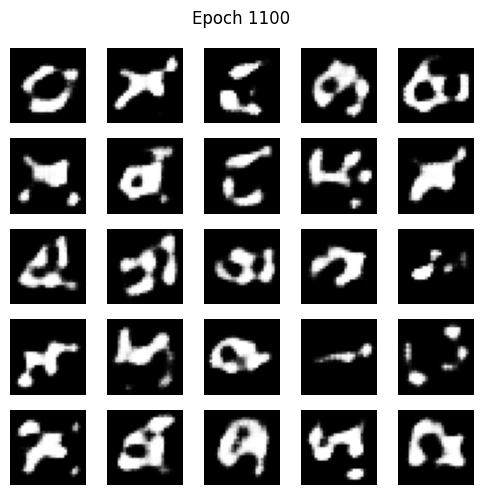

2/2 [==============================] - 0s 3ms/step
1200 [D loss: 0.6575, acc.: 56.25%] [G loss: 0.8039]
1/1 [==============================] - 0s 21ms/step


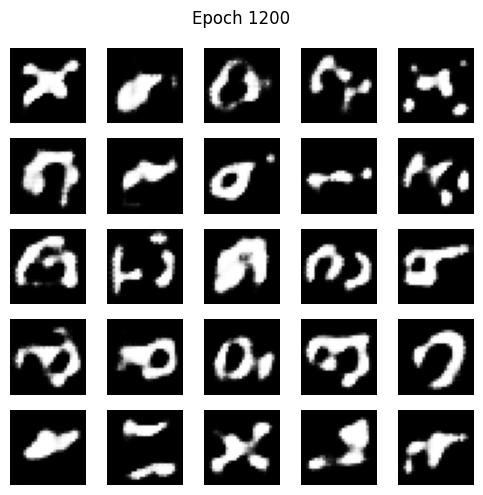

2/2 [==============================] - 0s 0s/step
1300 [D loss: 0.7124, acc.: 45.31%] [G loss: 0.8679]
1/1 [==============================] - 0s 32ms/step


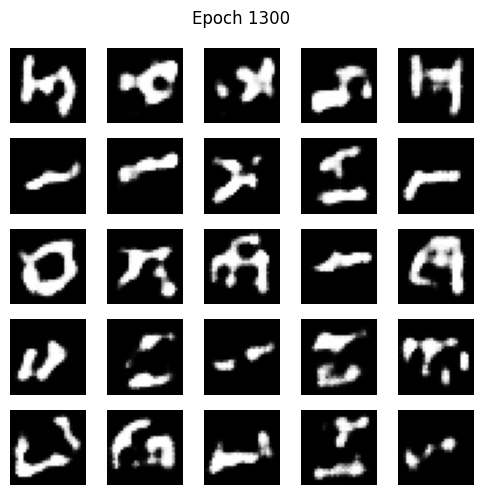

2/2 [==============================] - 0s 0s/step
1400 [D loss: 0.7056, acc.: 51.56%] [G loss: 0.8097]
1/1 [==============================] - 0s 27ms/step


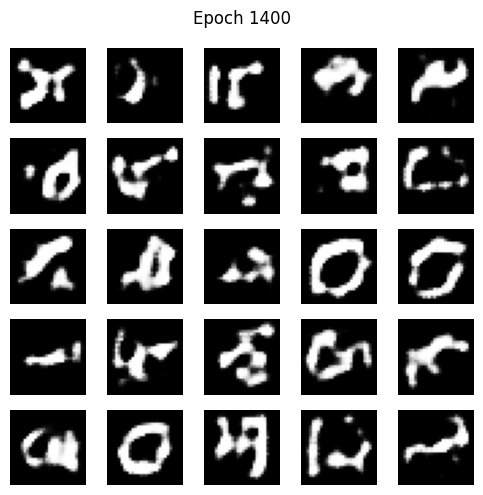

2/2 [==============================] - 0s 2ms/step
1500 [D loss: 0.6942, acc.: 54.69%] [G loss: 0.7961]
1/1 [==============================] - 0s 27ms/step


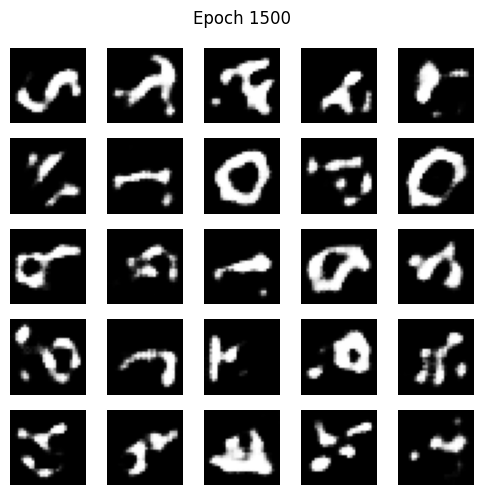

2/2 [==============================] - 0s 529us/step
1600 [D loss: 0.6891, acc.: 53.91%] [G loss: 0.8037]
1/1 [==============================] - 0s 27ms/step


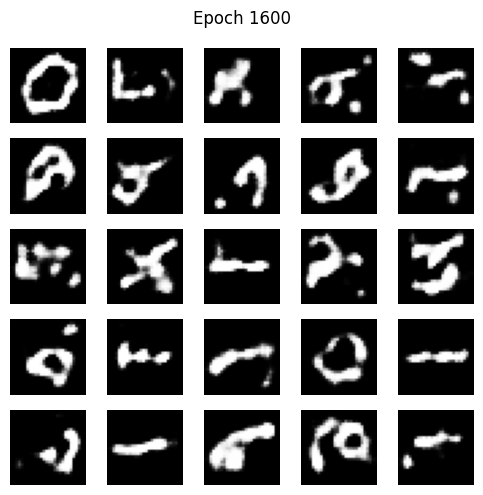

2/2 [==============================] - 0s 16ms/step
1700 [D loss: 0.6880, acc.: 58.59%] [G loss: 0.8217]
1/1 [==============================] - 0s 24ms/step


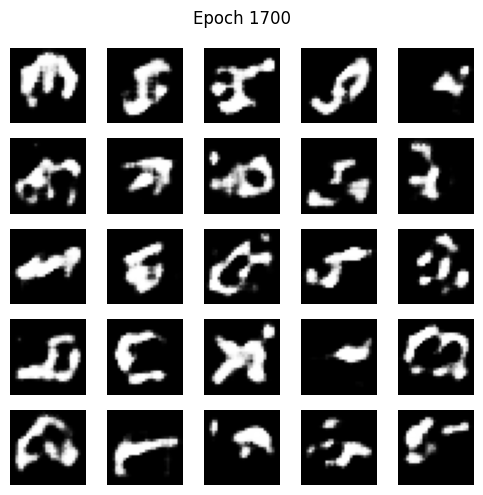

2/2 [==============================] - 0s 0s/step


KeyboardInterrupt: 

In [9]:
cgan = cGAN()
cgan.train(x_train, y_train, epochs=5000, batch_size=64, sample_interval=100)

# Generate 160 images after training
cgan.save_generated_images(n=160, folder="cganimg")

cGAN2

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import os

class cGAN2:
    def __init__(self, img_shape=(28, 28, 1), latent_dim=100, num_classes=16):
        self.img_shape = img_shape
        self.latent_dim = latent_dim
        self.num_classes = num_classes
        
        optimizer = tf.keras.optimizers.Adam(0.0002, 0.5)

        # Build and compile discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(
            loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy']
        )
        
        # Build generator
        self.generator = self.build_generator()
        
        # Build combined GAN model
        self.gan = self.build_gan()
        self.gan.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    def build_generator(self):
        # --- Using Functional API ---
        noise = layers.Input(shape=(self.latent_dim,))
        label = layers.Input(shape=(1,), dtype='int32')

        label_embedding = layers.Embedding(self.num_classes, self.latent_dim)(label)
        label_embedding = layers.Flatten()(label_embedding)

        model_input = layers.concatenate([noise, label_embedding])

        # Model architecture
        x = layers.Dense(7 * 7 * 256, use_bias=False)(model_input)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)
        x = layers.Reshape((7, 7, 256))(x)

        x = layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)

        x = layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        x = layers.LeakyReLU()(x)

        img = layers.Conv2DTranspose(self.img_shape[2], (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')(x)

        return models.Model([noise, label], img)
    
    def build_discriminator(self):
        # --- Using Functional API ---
        img = layers.Input(shape=self.img_shape)
        label = layers.Input(shape=(1,), dtype='int32')

        label_embedding = layers.Embedding(self.num_classes, np.prod(self.img_shape))(label)
        label_embedding = layers.Reshape(self.img_shape)(label_embedding)

        concatenated = layers.concatenate([img, label_embedding])
        
        # Model architecture
        x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(concatenated)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
        x = layers.LeakyReLU()(x)
        x = layers.Dropout(0.3)(x)

        x = layers.Flatten()(x)
        validity = layers.Dense(1, activation='sigmoid')(x) # Added sigmoid for binary classification

        return models.Model([img, label], validity)
    
    def build_gan(self):
        self.discriminator.trainable = False
        
        noise = layers.Input(shape=(self.latent_dim,))
        # Corrected label input to expect integer indices
        label = layers.Input(shape=(1,), dtype='int32')
        
        img = self.generator([noise, label])
        validity = self.discriminator([img, label])
        
        return models.Model([noise, label], validity)
    
    def train(self, x_train, y_train, epochs, batch_size=64, sample_interval=500):
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        # Convert one-hot labels to integer labels once
        y_train_int = np.argmax(y_train, axis=1)
        
        for epoch in range(1, epochs + 1):
            # --- Train discriminator ---
            idx = np.random.randint(0, x_train.shape[0], batch_size)
            real_imgs, real_labels = x_train[idx], y_train_int[idx]
            
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            # Generate random integer labels directly
            fake_labels = np.random.randint(0, self.num_classes, batch_size)
            gen_imgs = self.generator.predict([noise, fake_labels], verbose=0)
            
            d_loss_real = self.discriminator.train_on_batch([real_imgs, real_labels], valid)
            d_loss_fake = self.discriminator.train_on_batch([gen_imgs, fake_labels], fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            
            # --- Train generator ---
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            sampled_labels = np.random.randint(0, self.num_classes, batch_size)
            g_loss = self.gan.train_on_batch([noise, sampled_labels], valid)
            
            if epoch % sample_interval == 0 or epoch == 1:
                print(f"{epoch} [D loss: {d_loss[0]:.4f}, acc.: {100*d_loss[1]:.2f}%] [G loss: {g_loss:.4f}]")
                self.sample_images(epoch, y_train_int)
    
    def sample_images(self, epoch, y_train_int, n=25):
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        # Use integer labels for sampling
        labels = y_train_int[np.random.randint(0, y_train_int.shape[0], n)]
        gen_imgs = self.generator.predict([noise, labels], verbose=0)
        
        # Rescale images from [-1, 1] to [0, 255]
        gen_imgs = 0.5 * gen_imgs + 0.5
        gen_imgs = (gen_imgs * 255).astype("uint8")
        
        plt.figure(figsize=(5, 5))
        for i in range(n):
            plt.subplot(5, 5, i + 1)
            plt.imshow(gen_imgs[i, :, :, 0], cmap='gray')
            plt.axis('off')
        plt.suptitle(f"Epoch {epoch}")
        plt.tight_layout()
        plt.show()
        
    def generate_images(self, n, y_labels):
        # y_labels should be integer-encoded
        noise = np.random.normal(0, 1, (n, self.latent_dim))
        gen_imgs = self.generator.predict([noise, y_labels], verbose=0)
        return gen_imgs

    def save_generated_images(self, n=160, folder="cganimg", y_labels=None):
        if not os.path.exists(folder):
            os.makedirs(folder)

        if y_labels is None:
            # Correctly generate random integer labels
            y_labels = np.random.randint(0, self.num_classes, n)

        gen_imgs = self.generate_images(n, y_labels)
        # Rescale images from [-1, 1] to [0, 255]
        gen_imgs = 0.5 * gen_imgs + 0.5
        gen_imgs = (gen_imgs * 255).astype("uint8")

        for i in range(n):
            img = gen_imgs[i, :, :, 0]
            filepath = os.path.join(folder, f"image_{i:03d}.png")
            plt.imsave(filepath, img, cmap='gray')
            
        print(f"Saved {n} images to folder: {folder}")

1 [D loss: 0.6884, acc.: 44.53%] [G loss: 0.6616]


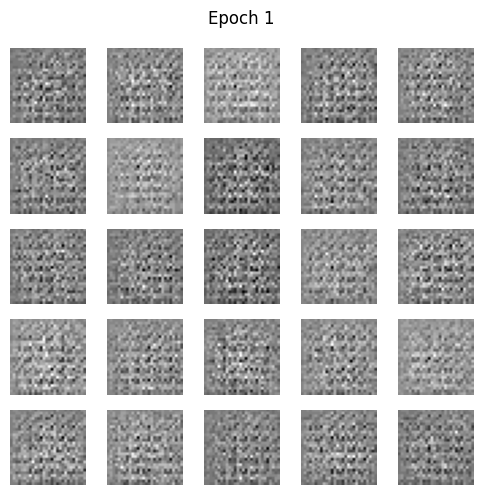

100 [D loss: 0.0021, acc.: 100.00%] [G loss: 0.0000]


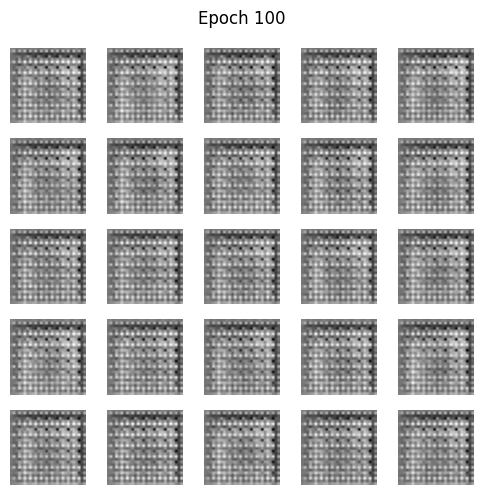

200 [D loss: 0.0009, acc.: 100.00%] [G loss: 0.0000]


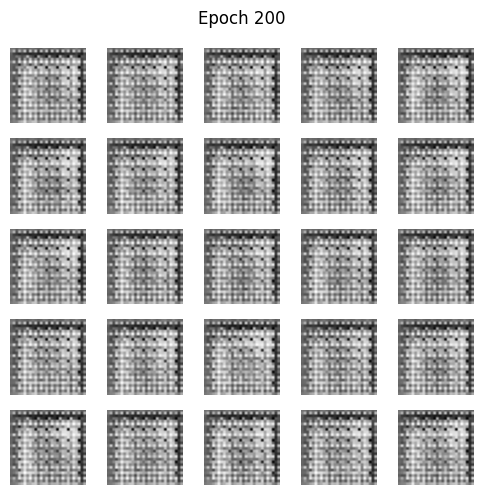

300 [D loss: 0.0014, acc.: 100.00%] [G loss: 0.0001]


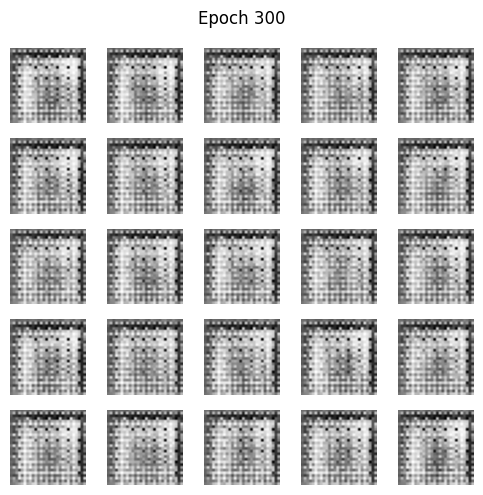

400 [D loss: 0.3500, acc.: 83.59%] [G loss: 0.1041]


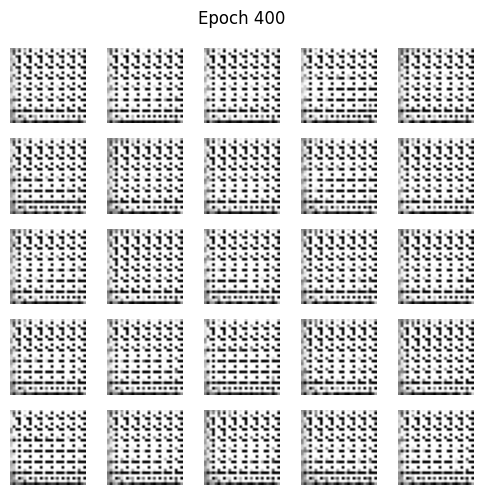

500 [D loss: 0.0762, acc.: 99.22%] [G loss: 0.0262]


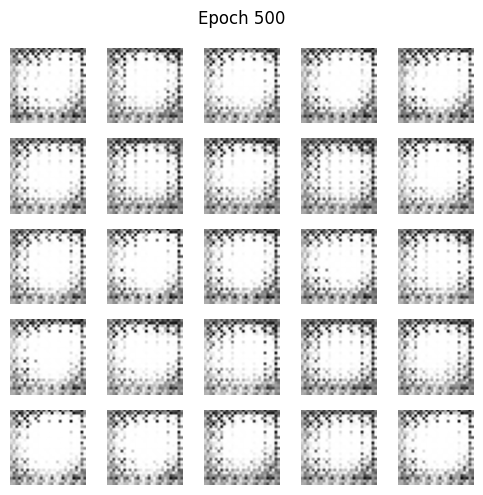

600 [D loss: 0.0406, acc.: 100.00%] [G loss: 0.0348]


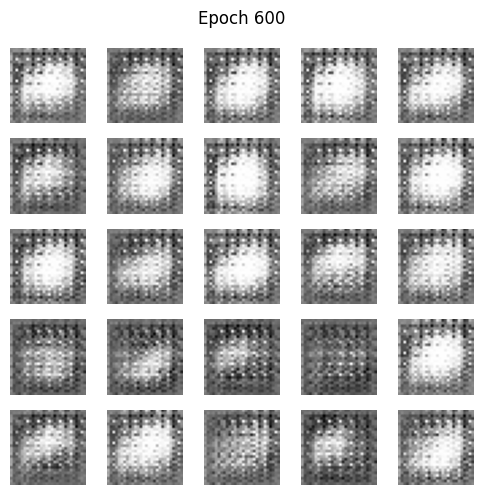

700 [D loss: 0.5395, acc.: 74.22%] [G loss: 0.2097]


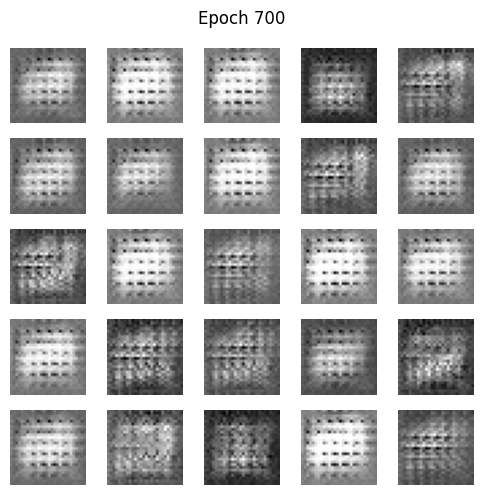

800 [D loss: 0.1424, acc.: 100.00%] [G loss: 0.0213]


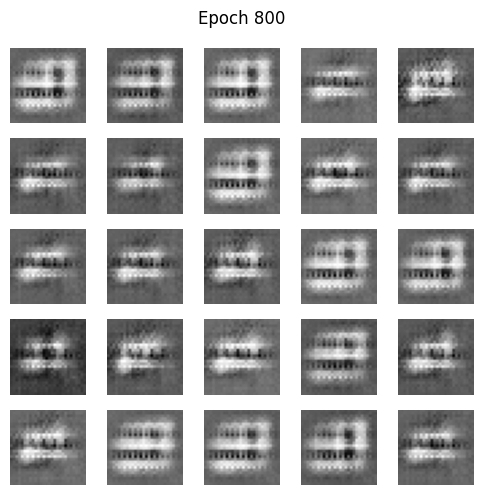

900 [D loss: 0.5123, acc.: 75.78%] [G loss: 0.2117]


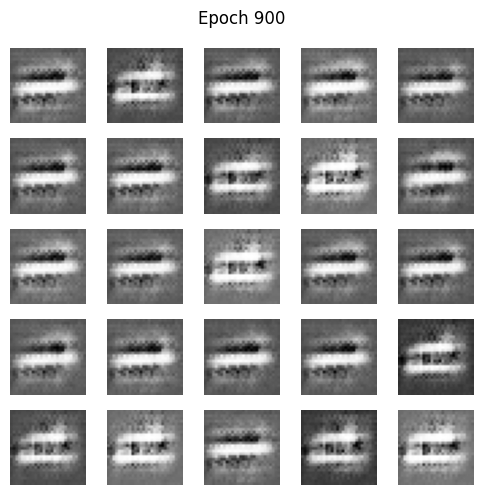

1000 [D loss: 0.7285, acc.: 59.38%] [G loss: 0.8931]


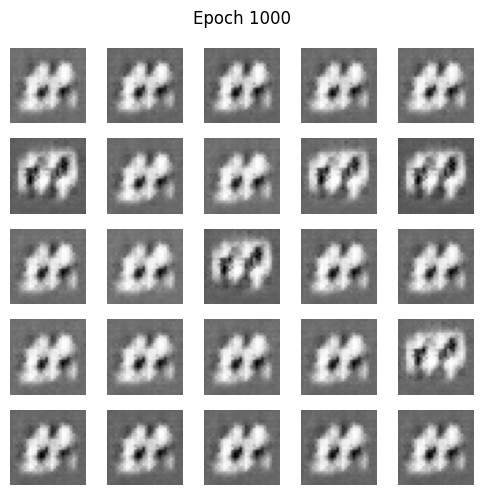

1100 [D loss: 0.5786, acc.: 83.59%] [G loss: 0.6678]


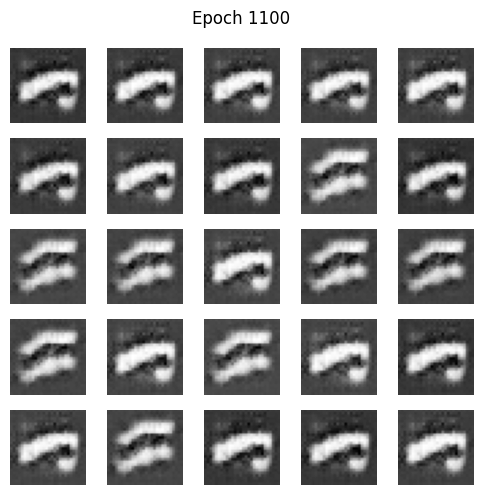

1200 [D loss: 0.4037, acc.: 94.53%] [G loss: 0.3140]


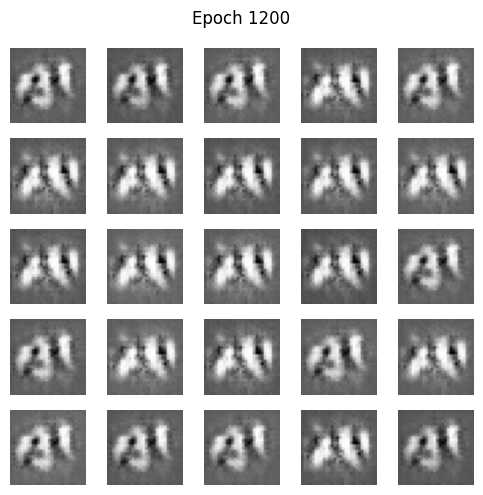

1300 [D loss: 0.4809, acc.: 82.03%] [G loss: 0.7388]


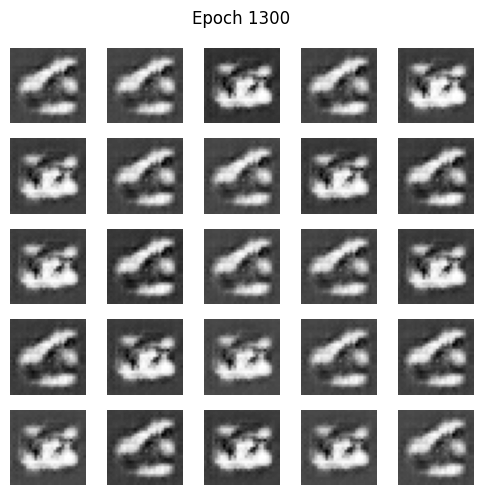

1400 [D loss: 0.0925, acc.: 100.00%] [G loss: 0.0961]


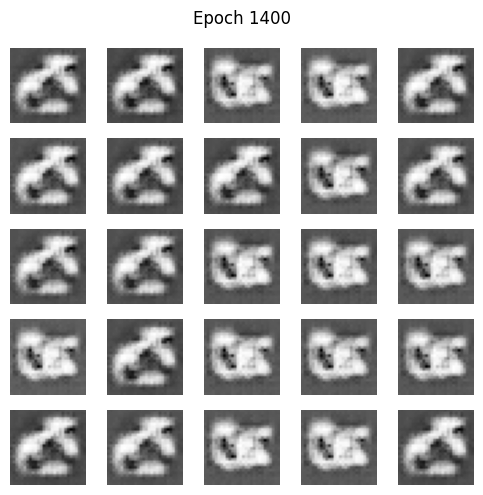

1500 [D loss: 0.2294, acc.: 97.66%] [G loss: 0.2970]


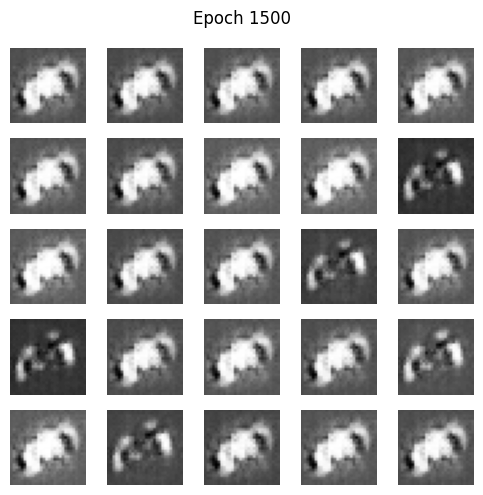

1600 [D loss: 0.4788, acc.: 81.25%] [G loss: 0.9544]


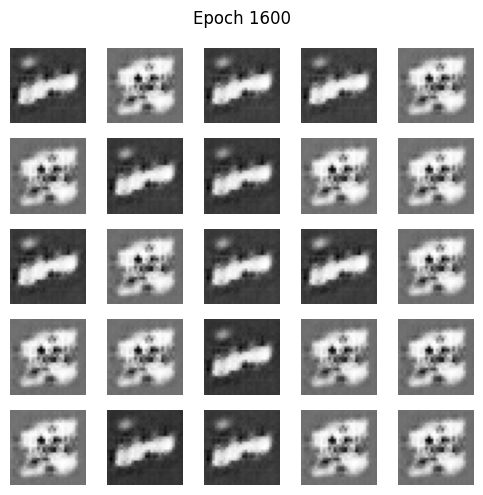

1700 [D loss: 0.3239, acc.: 89.84%] [G loss: 0.5774]


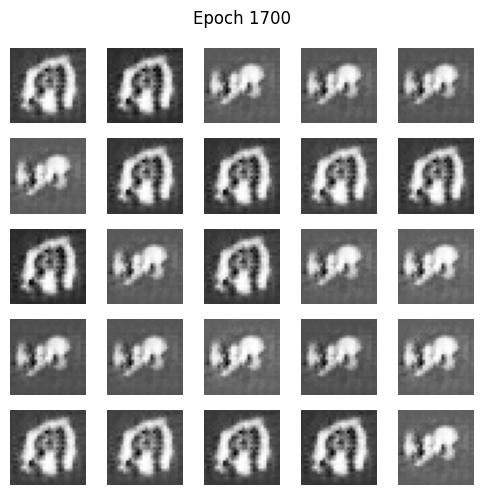

1800 [D loss: 0.2507, acc.: 94.53%] [G loss: 0.4533]


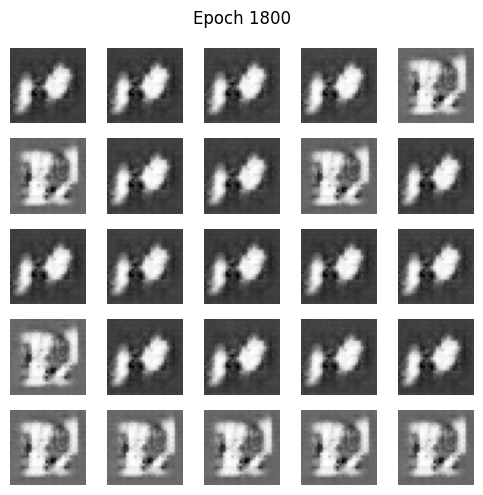

1900 [D loss: 0.3480, acc.: 89.84%] [G loss: 1.0446]


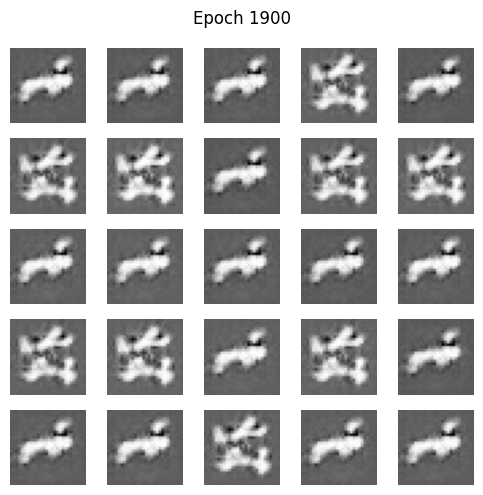

2000 [D loss: 0.3019, acc.: 89.84%] [G loss: 2.0275]


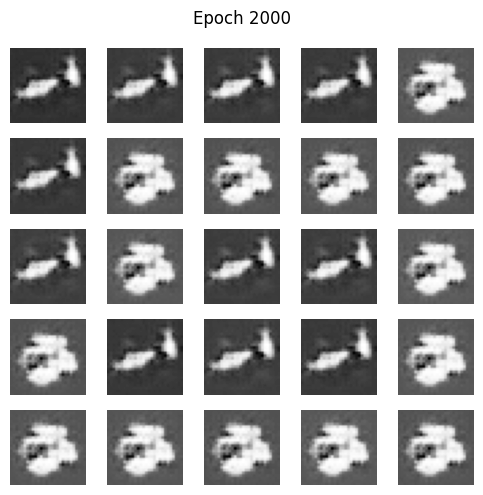

2100 [D loss: 0.2625, acc.: 93.75%] [G loss: 1.4251]


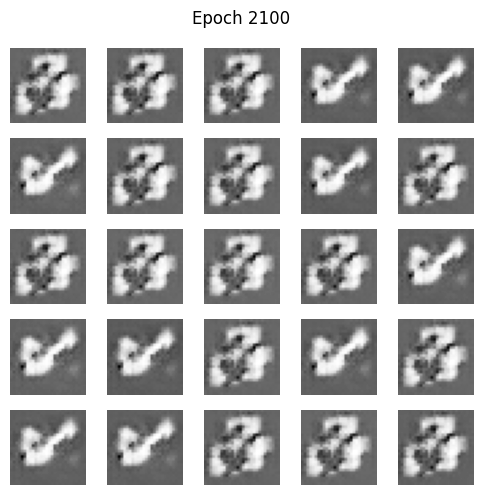

2200 [D loss: 0.2259, acc.: 95.31%] [G loss: 1.7955]


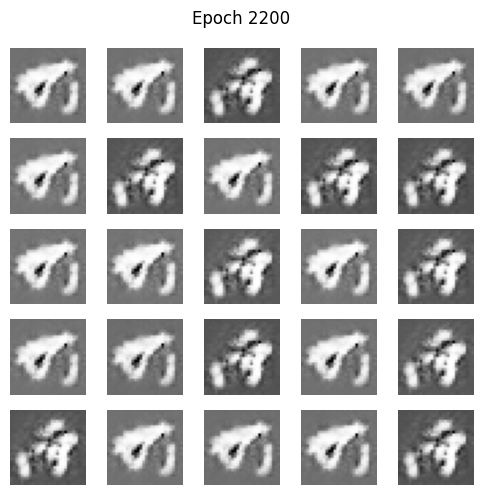

2300 [D loss: 0.1755, acc.: 97.66%] [G loss: 0.5826]


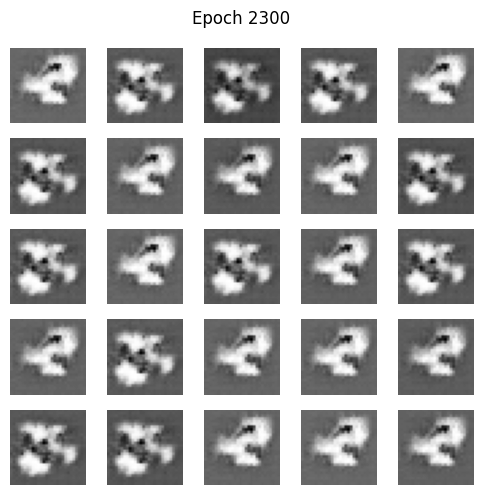

2400 [D loss: 0.1731, acc.: 95.31%] [G loss: 1.4488]


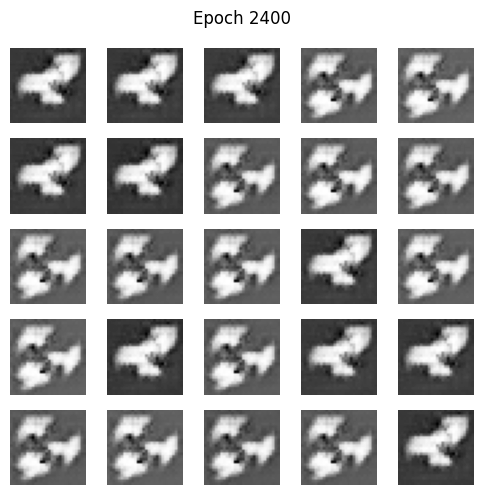

2500 [D loss: 0.1074, acc.: 99.22%] [G loss: 0.9825]


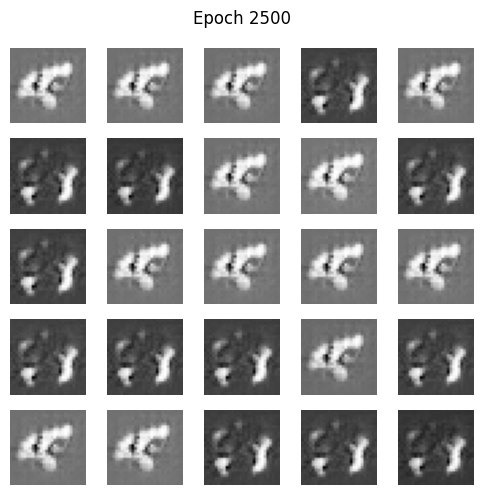

2600 [D loss: 0.0644, acc.: 99.22%] [G loss: 0.2735]


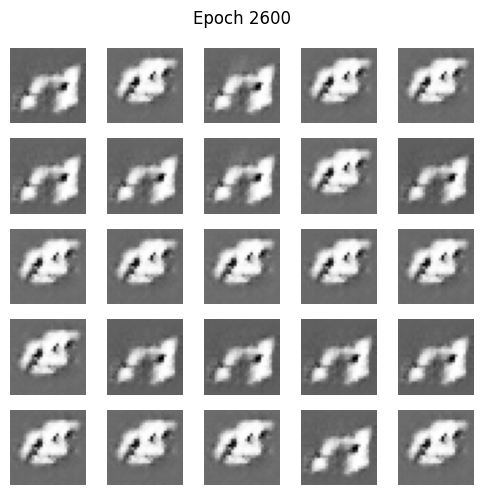

2700 [D loss: 0.0179, acc.: 100.00%] [G loss: 0.6917]


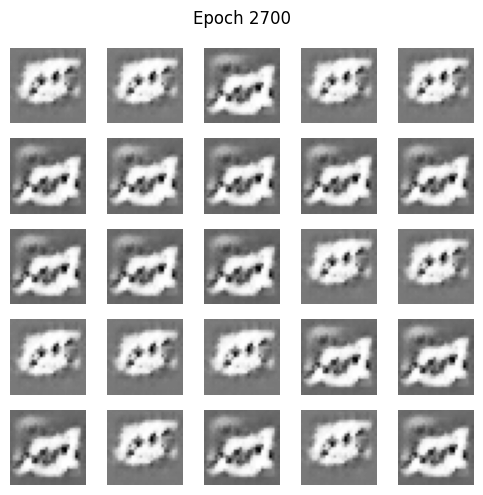

2800 [D loss: 0.0262, acc.: 99.22%] [G loss: 1.0277]


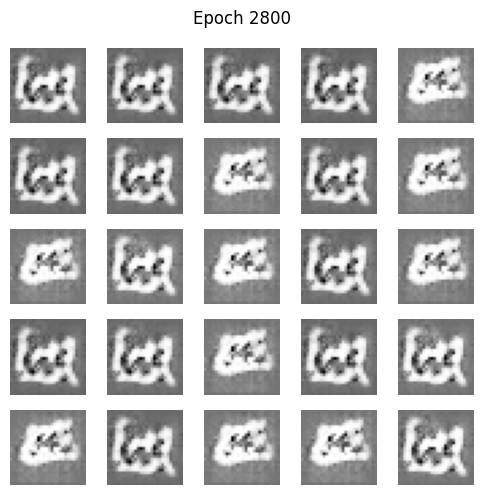

2900 [D loss: 0.0550, acc.: 98.44%] [G loss: 0.1819]


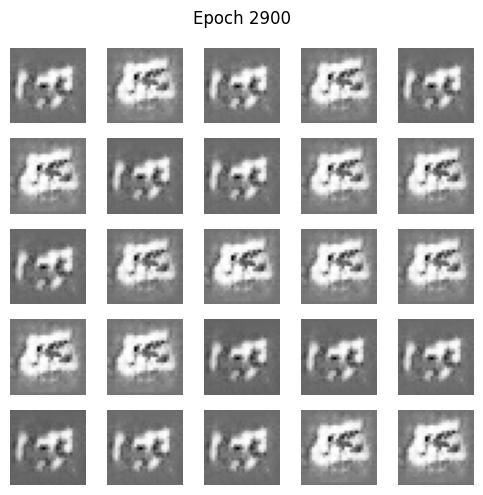

3000 [D loss: 0.2357, acc.: 92.19%] [G loss: 3.5044]


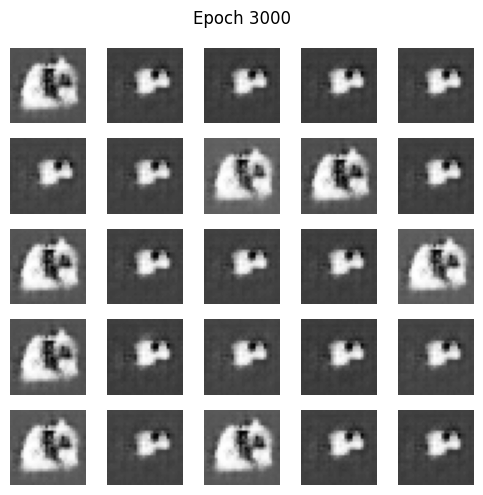

3100 [D loss: 0.0351, acc.: 99.22%] [G loss: 0.2718]


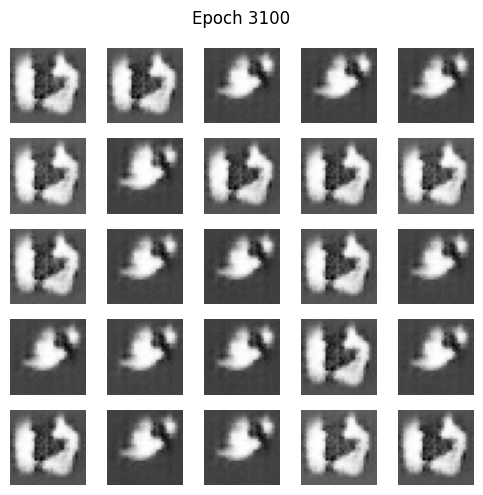

3200 [D loss: 0.1448, acc.: 96.09%] [G loss: 3.9775]


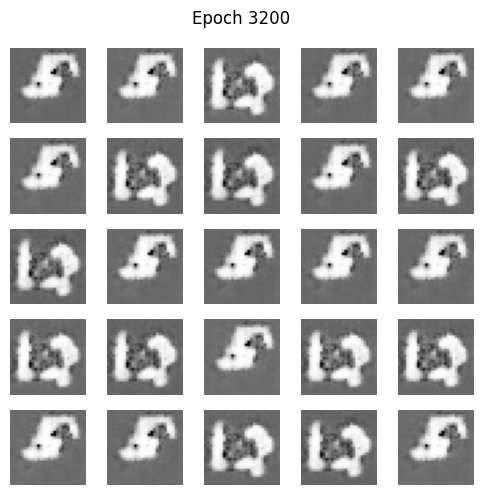

3300 [D loss: 0.1703, acc.: 92.97%] [G loss: 3.7521]


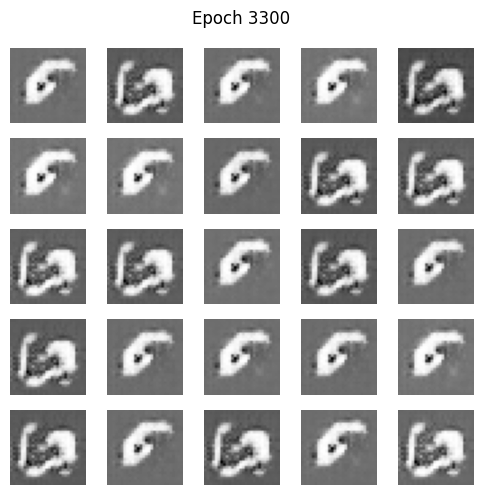

3400 [D loss: 0.0829, acc.: 96.09%] [G loss: 1.6739]


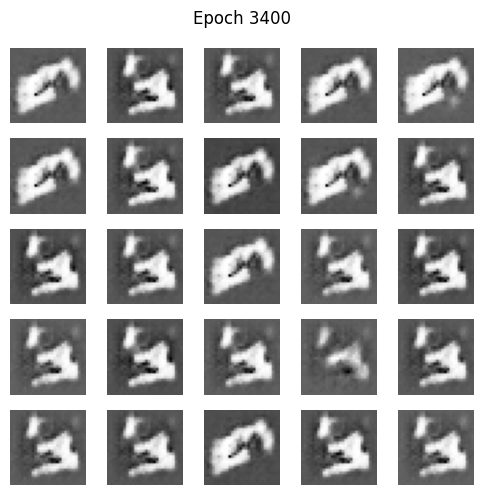

3500 [D loss: 0.1847, acc.: 91.41%] [G loss: 4.0681]


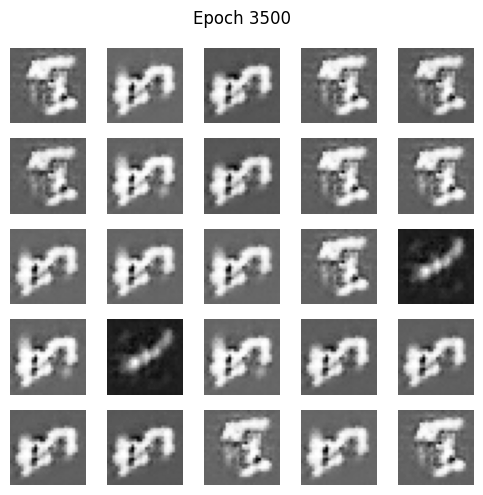

3600 [D loss: 0.1118, acc.: 97.66%] [G loss: 3.7556]


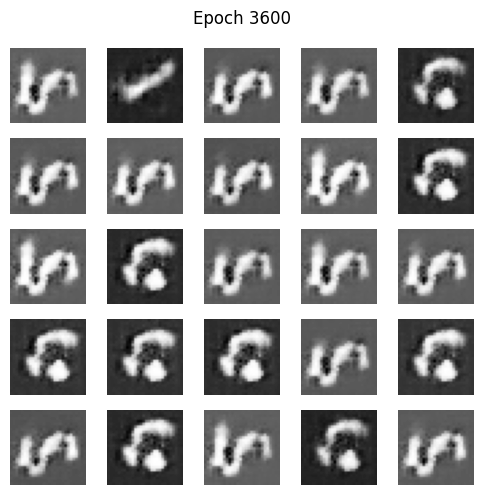

KeyboardInterrupt: 

In [ ]:
cgan = cGAN2()
cgan.train(x_train, y_train, epochs=7500, batch_size=64, sample_interval=100)

# Generate 160 images after training
cgan.save_generated_images(n=160, folder="cganimg2")